# Housing Analysis

For this project, we are going to look at the U.S. housing market and, more specifically, at the housing market in Austin, Texas. The main question we are addressing is finding a data science solution to predict housing prices in the area. Predicting housing prices would allow both sellers and buyers, as well as their realtors, to define the appropriate house price in order to do a transaction on the market. Price predictor may also allow governments and other related agencies to make housing price predictions to assess the current state of the housing market.

### Exploratory Data Analysis & Data Cleaning

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
housing = pd.read_csv("C:\\Users\\ninas\\Housing\\archive (27)\\austinHousingData.csv")

In [3]:
# Let's make sure all columns show up when we are viewing the dataframe.
pd.pandas.set_option('display.max_columns', None)

In [4]:
# Let's view sample first rows and sample from the dataset to get an idea of what we have in it
housing.head()

,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage
0,111373431,pflugerville,14424 Lake Victor Dr,78660,"14424 Lake Victor Dr, Pflugerville, TX 78660 i...",30.430632,-97.663078,1.98,2,True,True,True,True,False,False,Single Family,2,2012,305000.0,5,2019-09-02,9,2019,"Coldwell Banker United, Realtors - South Austin",39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2,111373431_ffce26843283d3365c11d81b8e6bdc6f-p_f...
1,120900430,pflugerville,1104 Strickling Dr,78660,Absolutely GORGEOUS 4 Bedroom home with 2 full...,30.432673,-97.661697,1.98,2,True,True,True,True,False,False,Single Family,2,2013,295000.0,1,2020-10-13,10,2020,Agent Provided,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1,120900430_8255c127be8dcf0a1a18b7563d987088-p_f...
2,2084491383,pflugerville,1408 Fort Dessau Rd,78660,Under construction - estimated completion in A...,30.409748,-97.639771,1.98,0,True,True,False,True,False,False,Single Family,0,2018,256125.0,1,2019-07-31,7,2019,Agent Provided,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1,2084491383_a2ad649e1a7a098111dcea084a11c855-p_...
3,120901374,pflugerville,1025 Strickling Dr,78660,Absolutely darling one story home in charming ...,30.432112,-97.661659,1.98,2,True,True,True,True,False,False,Single Family,2,2013,240000.0,4,2018-08-08,8,2018,Agent Provided,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1,120901374_b469367a619da85b1f5ceb69b675d88e-p_f...
4,60134862,pflugerville,15005 Donna Jane Loop,78660,Brimming with appeal & warm livability! Sleek ...,30.437368,-97.656860,1.98,0,True,True,False,True,False,False,Single Family,0,2002,239900.0,3,2018-10-31,10,2018,Agent Provided,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2,60134862_b1a48a3df3f111e005bb913873e98ce2-p_f.jpg


In [5]:
# Check feature data types
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15171 entries, 0 to 15170
Data columns (total 47 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   zpid                        15171 non-null  int64  
 1   city                        15171 non-null  object 
 2   streetAddress               15171 non-null  object 
 3   zipcode                     15171 non-null  int64  
 4   description                 15169 non-null  object 
 5   latitude                    15171 non-null  float64
 6   longitude                   15171 non-null  float64
 7   propertyTaxRate             15171 non-null  float64
 8   garageSpaces                15171 non-null  int64  
 9   hasAssociation              15171 non-null  bool   
 10  hasCooling                  15171 non-null  bool   
 11  hasGarage                   15171 non-null  bool   
 12  hasHeating                  15171 non-null  bool   
 13  hasSpa                      151

In [6]:
# Let's create Austin housing map by charting the latitudes and longtitudes from  the database; let's color code it by house price
# pip install folium

In [7]:
# Note: I am going to keep this piece of code commented out; otherwise, it drastically slows down the notebook

# import folium
# from folium.plugins import BeautifyIcon
# from IPython.display import display

# # Calculate map center
# map_center = [housing['latitude'].mean(), housing['longitude'].mean()]

# # Create a Folium map
# mymap = folium.Map(location=map_center, zoom_start=10)

# # Create markers based on housing prices
# for index, row in housing.iterrows():
#     lat, lon, price = row['latitude'], row['longitude'], row['latestPrice']
#     color = 'green' if price <= 309000 else 'blue' if price <= 405000 else 'red'
    
#     # Use a small circular icon
#     small_circle_icon = BeautifyIcon(icon='circle', inner_icon_style='margin-top:0px; margin-left:0px;', border_color=color, text_color=color)
    
#     folium.Marker(location=[lat, lon], icon=small_circle_icon).add_to(mymap)

# # Display the map
# display(mymap)

In [8]:
type(housing)

pandas.core.frame.DataFrame

This database has 15,171 rows and 47 features.
It consists of intigers, objects, booleans, and floats. I think Description feature (out of object features) is definitely one that is worth analyzing using NLP techniques (such as CountVectorizer).

In [9]:
# Checking for duplicate rows. None identified
housing.duplicated().sum()

0

In [10]:
# Checking for duplicate columns. None identified
housing.T.duplicated().sum()

0

In [11]:
# There are only a few missing values in each column
housing.isna().sum(axis=0)

zpid                          0
city                          0
streetAddress                 0
zipcode                       0
description                   2
latitude                      0
longitude                     0
propertyTaxRate               0
garageSpaces                  0
hasAssociation                0
hasCooling                    0
hasGarage                     0
hasHeating                    0
hasSpa                        0
hasView                       0
homeType                      0
parkingSpaces                 0
yearBuilt                     0
latestPrice                   0
numPriceChanges               0
latest_saledate               0
latest_salemonth              0
latest_saleyear               0
latestPriceSource             0
numOfPhotos                   0
numOfAccessibilityFeatures    0
numOfAppliances               0
numOfParkingFeatures          0
numOfPatioAndPorchFeatures    0
numOfSecurityFeatures         0
numOfWaterfrontFeatures       0
numOfWin

In [12]:
# Because there are only two missing values, let's drop those rows
housing.shape

(15171, 47)

In [13]:
housing.dropna(inplace=True)

In [14]:
housing.shape

(15169, 47)

The updated shape of our dataset has 15,169 rows.

In [15]:
# Only 9 unique values in column "city" - let's consider this to be a good candidate for a dummy variable
housing["city"].nunique()

9

In [16]:
# Too many unique zip codes - let's drop the column. Also, this information is captured in latitude and longtitide
housing["zipcode"].nunique()

48

In [17]:
# Also dropping Unique Identifier - Zillow (zpid) and streetAdress
housing_clean = housing.drop(["zipcode", "zpid", "streetAddress"], axis=1)

In [18]:
# Good amount of unique values to transform homeType to dummy, I think.  
housing["homeType"].nunique()

10

In [19]:
# Property tax rate only has three brackets, let's keep it to incorporate as a dummy variable
housing["propertyTaxRate"].nunique()

3

In [20]:
housing_clean.head()

,city,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage
0,pflugerville,"14424 Lake Victor Dr, Pflugerville, TX 78660 i...",30.430632,-97.663078,1.98,2,True,True,True,True,False,False,Single Family,2,2012,305000.0,5,2019-09-02,9,2019,"Coldwell Banker United, Realtors - South Austin",39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2,111373431_ffce26843283d3365c11d81b8e6bdc6f-p_f...
1,pflugerville,Absolutely GORGEOUS 4 Bedroom home with 2 full...,30.432673,-97.661697,1.98,2,True,True,True,True,False,False,Single Family,2,2013,295000.0,1,2020-10-13,10,2020,Agent Provided,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1,120900430_8255c127be8dcf0a1a18b7563d987088-p_f...
2,pflugerville,Under construction - estimated completion in A...,30.409748,-97.639771,1.98,0,True,True,False,True,False,False,Single Family,0,2018,256125.0,1,2019-07-31,7,2019,Agent Provided,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1,2084491383_a2ad649e1a7a098111dcea084a11c855-p_...
3,pflugerville,Absolutely darling one story home in charming ...,30.432112,-97.661659,1.98,2,True,True,True,True,False,False,Single Family,2,2013,240000.0,4,2018-08-08,8,2018,Agent Provided,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1,120901374_b469367a619da85b1f5ceb69b675d88e-p_f...
4,pflugerville,Brimming with appeal & warm livability! Sleek ...,30.437368,-97.656860,1.98,0,True,True,False,True,False,False,Single Family,0,2002,239900.0,3,2018-10-31,10,2018,Agent Provided,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2,60134862_b1a48a3df3f111e005bb913873e98ce2-p_f.jpg


In [21]:
# Let's drop some of the other columns which I do not consider useful for our analysis
housing_clean.drop(["latest_saledate", "latestPriceSource", "homeImage"], axis=1, inplace=True)

In [22]:
# Time to substitute boolean values with 0 and 1

housing_clean['hasAssociation'] = housing_clean['hasAssociation'].astype(int)
# "hasAssociation" indicates if there is a Homeowners Association associated with the listing.

housing_clean['hasCooling'] = housing_clean['hasCooling'].astype(int)

housing_clean['hasGarage'] = housing_clean['hasGarage'].astype(int)

housing_clean['hasHeating'] = housing_clean['hasHeating'].astype(int)

housing_clean['hasSpa'] = housing_clean['hasSpa'].astype(int)

housing_clean['hasView'] = housing_clean['hasView'].astype(int)

In [23]:
housing_clean

,city,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories
0,pflugerville,"14424 Lake Victor Dr, Pflugerville, TX 78660 i...",30.430632,-97.663078,1.98,2,1,1,1,1,0,0,Single Family,2,2012,305000.0,5,9,2019,39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2
1,pflugerville,Absolutely GORGEOUS 4 Bedroom home with 2 full...,30.432673,-97.661697,1.98,2,1,1,1,1,0,0,Single Family,2,2013,295000.0,1,10,2020,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1
2,pflugerville,Under construction - estimated completion in A...,30.409748,-97.639771,1.98,0,1,1,0,1,0,0,Single Family,0,2018,256125.0,1,7,2019,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1
3,pflugerville,Absolutely darling one story home in charming ...,30.432112,-97.661659,1.98,2,1,1,1,1,0,0,Single Family,2,2013,240000.0,4,8,2018,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1
4,pflugerville,Brimming with appeal & warm livability! Sleek ...,30.437368,-97.656860,1.98,0,1,1,0,1,0,0,Single Family,0,2002,239900.0,3,10,2018,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15166,austin,Not for rent!\n\nBeautiful one story home in T...,30.161997,-97.816345,1.98,6,0,1,1,1,0,1,Single Family,6,1986,330000.0,1,12,2020,49,0,3,2,4,0,0,0,0,6534.0,1234.0,1,0,1,1,0.900000,3.333333,1424,14,2.0,3,1
15167,austin,This contemporary three-story detached condo h...,30.240223,-97.772835,1.98,2,1,1,1,1,1,1,Single Family,2,2016,550000.0,1,12,2020,32,1,5,2,2,1,0,0,0,2439.0,1888.0,1,0,1,1,1.900000,6.666667,1226,16,4.0,3,3
15168,austin,Original bungalow with a modern addition. Larg...,30.244835,-97.761124,1.98,2,0,1,1,1,0,0,Single Family,2,1936,875000.0,7,1,2021,20,0,3,3,0,0,0,0,0,9408.0,1524.0,1,0,1,1,0.800000,5.000000,889,13,3.0,3,2
15169,austin,So many options at this address in the eclecti...,30.281569,-97.717789,1.98,0,0,1,0,1,0,0,MultiFamily,0,1968,420000.0,5,8,2019,15,0,3,1,0,0,0,0,0,6098.0,6068.0,1,0,1,1,1.300000,6.666667,1057,15,2.0,4,1


In [24]:
# Let's drop some of the other columns which I do not consider useful for our analysis
housing_clean.drop(["description"], axis=1, inplace=True)

In [25]:
print(housing_clean.dtypes)

city                           object
latitude                      float64
longitude                     float64
propertyTaxRate               float64
garageSpaces                    int64
hasAssociation                  int32
hasCooling                      int32
hasGarage                       int32
hasHeating                      int32
hasSpa                          int32
hasView                         int32
homeType                       object
parkingSpaces                   int64
yearBuilt                       int64
latestPrice                   float64
numPriceChanges                 int64
latest_salemonth                int64
latest_saleyear                 int64
numOfPhotos                     int64
numOfAccessibilityFeatures      int64
numOfAppliances                 int64
numOfParkingFeatures            int64
numOfPatioAndPorchFeatures      int64
numOfSecurityFeatures           int64
numOfWaterfrontFeatures         int64
numOfWindowFeatures             int64
numOfCommuni

In [26]:
# Let's get dummies for the remaining 'object' type features - city and homeType
housing_clean = pd.get_dummies(housing_clean, dtype=int, drop_first=True)

In [27]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(housing_clean.dtypes)

latitude                          float64
longitude                         float64
propertyTaxRate                   float64
garageSpaces                        int64
hasAssociation                      int32
hasCooling                          int32
hasGarage                           int32
hasHeating                          int32
hasSpa                              int32
hasView                             int32
parkingSpaces                       int64
yearBuilt                           int64
latestPrice                       float64
numPriceChanges                     int64
latest_salemonth                    int64
latest_saleyear                     int64
numOfPhotos                         int64
numOfAccessibilityFeatures          int64
numOfAppliances                     int64
numOfParkingFeatures                int64
numOfPatioAndPorchFeatures          int64
numOfSecurityFeatures               int64
numOfWaterfrontFeatures             int64
numOfWindowFeatures               

In [28]:
housing_clean.head()

,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,city_del valle,city_driftwood,city_dripping springs,city_manchaca,city_manor,city_pflugerville,city_road,city_west lake hills,homeType_Condo,homeType_Mobile / Manufactured,homeType_MultiFamily,homeType_Multiple Occupancy,homeType_Other,homeType_Residential,homeType_Single Family,homeType_Townhouse,homeType_Vacant Land
0,30.430632,-97.663078,1.98,2,1,1,1,1,0,0,2,2012,305000.0,5,9,2019,39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
1,30.432673,-97.661697,1.98,2,1,1,1,1,0,0,2,2013,295000.0,1,10,2020,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
2,30.409748,-97.639771,1.98,0,1,1,0,1,0,0,0,2018,256125.0,1,7,2019,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
3,30.432112,-97.661659,1.98,2,1,1,1,1,0,0,2,2013,240000.0,4,8,2018,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
4,30.437368,-97.656860,1.98,0,1,1,0,1,0,0,0,2002,239900.0,3,10,2018,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


In [29]:
# # Save the dataframe to a CSV file
# housing_clean.to_csv('housing_clean.csv', index=False) # don't need to do it at every re-run of the model

In [30]:
# cont_var = list(housing_clean.select_dtypes(exclude=['bool', 'object']))

# plt.subplots(9, 4, figsize=(15,8))
# plot_num=1

# for col in cont_var:
#     var = housing_clean[col]
#     var_mean = var.mean()
#     var_median = var.median()
    
#     plt.subplot(9, 4, plot_num)
#     sns.histplot(var)
#     plt.axvline(var_mean, c="r", label="Mean")
#     plt.axvline(var_median, c="g", label="Median")
#     plt.legend()
#     plot_num +=1
# plt.tight_layout()
# plt.show()

### Linear Regression

In [31]:
X = housing_clean.drop("latestPrice", axis=1)
y = housing_clean["latestPrice"]

In [32]:
X.head()

,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,parkingSpaces,yearBuilt,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,city_del valle,city_driftwood,city_dripping springs,city_manchaca,city_manor,city_pflugerville,city_road,city_west lake hills,homeType_Condo,homeType_Mobile / Manufactured,homeType_MultiFamily,homeType_Multiple Occupancy,homeType_Other,homeType_Residential,homeType_Single Family,homeType_Townhouse,homeType_Vacant Land
0,30.430632,-97.663078,1.98,2,1,1,1,1,0,0,2,2012,5,9,2019,39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
1,30.432673,-97.661697,1.98,2,1,1,1,1,0,0,2,2013,1,10,2020,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
2,30.409748,-97.639771,1.98,0,1,1,0,1,0,0,0,2018,1,7,2019,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
3,30.432112,-97.661659,1.98,2,1,1,1,1,0,0,2,2013,4,8,2018,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
4,30.437368,-97.656860,1.98,0,1,1,0,1,0,0,0,2002,3,10,2018,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


In [33]:
# I am commenting out the correlation matrix because it is too heavy.

# corr_df = X.corr()
# mask=np.triu(corr_df)
# plt.figure(figsize=(200,200))
# sns.heatmap(corr_df.round(2), annot=True, vmax=1, vmin=-1, center=0, cmap="coolwarm", mask=mask)
# plt.show()

In [34]:
# Not much is visible from the above chart. Let's try to identify features with correlation >0.8, as a starting point.

corr_matrix = X.corr()

# Set the threshold for correlation
threshold = 0.8

# Find pairs of features with correlation above the threshold
high_corr_pairs = np.where(np.abs(corr_matrix) > threshold)

# Create a DataFrame to store the pairs and their correlation values
high_corr_df = pd.DataFrame({
    'Feature 1': X.columns[high_corr_pairs[0]],
    'Feature 2': X.columns[high_corr_pairs[1]],
    'Correlation': corr_matrix.values[high_corr_pairs]
})

# Filter out pairs where Feature 1 is the same as Feature 2 (self-correlation)
high_corr_df = high_corr_df[high_corr_df['Feature 1'] != high_corr_df['Feature 2']]

# Print or display the DataFrame with high correlation pairs
print(high_corr_df)

                 Feature 1               Feature 2  Correlation
4             garageSpaces               hasGarage     0.822104
5             garageSpaces           parkingSpaces     0.997321
8                hasGarage            garageSpaces     0.822104
10               hasGarage           parkingSpaces     0.818602
14           parkingSpaces            garageSpaces     0.997321
15           parkingSpaces               hasGarage     0.818602
33     numOfPrimarySchools  numOfElementarySchools    -0.832491
34  numOfElementarySchools     numOfPrimarySchools    -0.832491


In [35]:
X.drop(["hasGarage", "garageSpaces", "numOfElementarySchools"], axis=1, inplace=True)

In [36]:
# Let's try to identify features with correlation >0.6, as a follow up.

corr_matrix = X.corr()

# Set the threshold for correlation
threshold = 0.6

# Find pairs of features with correlation above the threshold
high_corr_pairs = np.where(np.abs(corr_matrix) > threshold)

# Create a DataFrame to store the pairs and their correlation values
high_corr_df = pd.DataFrame({
    'Feature 1': X.columns[high_corr_pairs[0]],
    'Feature 2': X.columns[high_corr_pairs[1]],
    'Correlation': corr_matrix.values[high_corr_pairs]
})

# Filter out pairs where Feature 1 is the same as Feature 2 (self-correlation)
high_corr_df = high_corr_df[high_corr_df['Feature 1'] != high_corr_df['Feature 2']]

# Print or display the DataFrame with high correlation pairs
print(high_corr_df)

                   Feature 1                 Feature 2  Correlation
4             hasAssociation                 yearBuilt     0.616029
6                 hasCooling                hasHeating     0.679139
7                 hasHeating                hasCooling     0.679139
12             parkingSpaces      numOfParkingFeatures     0.639859
13                 yearBuilt            hasAssociation     0.616029
21      numOfParkingFeatures             parkingSpaces     0.639859
28    numOfCommunityFeatures      homeType_Residential     0.680576
36           avgSchoolRating             avgSchoolSize     0.616229
37           avgSchoolRating  MedianStudentsPerTeacher     0.734560
38             avgSchoolSize           avgSchoolRating     0.616229
40             avgSchoolSize  MedianStudentsPerTeacher     0.633239
41  MedianStudentsPerTeacher           avgSchoolRating     0.734560
42  MedianStudentsPerTeacher             avgSchoolSize     0.633239
45            numOfBathrooms             numOfBe

In [37]:
X.drop(["hasAssociation", "hasCooling", "numOfParkingFeatures", "numOfCommunityFeatures", "avgSchoolRating"], axis=1, inplace=True)

In [38]:
# Let's try to identify features with correlation >0.6, as a follow up.

corr_matrix = X.corr()

# Set the threshold for correlation
threshold = 0.6

# Find pairs of features with correlation above the threshold
high_corr_pairs = np.where(np.abs(corr_matrix) > threshold)

# Create a DataFrame to store the pairs and their correlation values
high_corr_df = pd.DataFrame({
    'Feature 1': X.columns[high_corr_pairs[0]],
    'Feature 2': X.columns[high_corr_pairs[1]],
    'Correlation': corr_matrix.values[high_corr_pairs]
})

# Filter out pairs where Feature 1 is the same as Feature 2 (self-correlation)
high_corr_df = high_corr_df[high_corr_df['Feature 1'] != high_corr_df['Feature 2']]

# Print or display the DataFrame with high correlation pairs
print(high_corr_df)

                   Feature 1                 Feature 2  Correlation
25             avgSchoolSize  MedianStudentsPerTeacher     0.633239
26  MedianStudentsPerTeacher             avgSchoolSize     0.633239
29            numOfBathrooms             numOfBedrooms     0.616193
30             numOfBedrooms            numOfBathrooms     0.616193
42            homeType_Condo    homeType_Single Family    -0.699686
48    homeType_Single Family            homeType_Condo    -0.699686


In [39]:
X.drop(["MedianStudentsPerTeacher", "numOfBathrooms", "homeType_Condo"], axis=1, inplace=True)

In [40]:
# Let's try to identify features with correlation >0.5, as a follow up.

corr_matrix = X.corr()

# Set the threshold for correlation
threshold = 0.5

# Find pairs of features with correlation above the threshold
high_corr_pairs = np.where(np.abs(corr_matrix) > threshold)

# Create a DataFrame to store the pairs and their correlation values
high_corr_df = pd.DataFrame({
    'Feature 1': X.columns[high_corr_pairs[0]],
    'Feature 2': X.columns[high_corr_pairs[1]],
    'Correlation': corr_matrix.values[high_corr_pairs]
})

# Filter out pairs where Feature 1 is the same as Feature 2 (self-correlation)
high_corr_df = high_corr_df[high_corr_df['Feature 1'] != high_corr_df['Feature 2']]

# Print or display the DataFrame with high correlation pairs
print(high_corr_df)

                     Feature 1                   Feature 2  Correlation
11             latest_saleyear  numOfPatioAndPorchFeatures     0.539522
15  numOfPatioAndPorchFeatures             latest_saleyear     0.539522
17  numOfPatioAndPorchFeatures       numOfSecurityFeatures     0.522610
18       numOfSecurityFeatures  numOfPatioAndPorchFeatures     0.522610
25         numOfPrimarySchools          numOfMiddleSchools    -0.535582
26         numOfPrimarySchools            numOfHighSchools     0.557452
27          numOfMiddleSchools         numOfPrimarySchools    -0.535582
29            numOfHighSchools         numOfPrimarySchools     0.557452


In [41]:
X.drop(["numOfPatioAndPorchFeatures", "numOfMiddleSchools", "numOfHighSchools"], axis=1, inplace=True)

In [42]:
# Let's try to identify features with correlation >0.5, as a follow up.

corr_matrix = X.corr()

# Set the threshold for correlation
threshold = 0.5

# Find pairs of features with correlation above the threshold
high_corr_pairs = np.where(np.abs(corr_matrix) > threshold)

# Create a DataFrame to store the pairs and their correlation values
high_corr_df = pd.DataFrame({
    'Feature 1': X.columns[high_corr_pairs[0]],
    'Feature 2': X.columns[high_corr_pairs[1]],
    'Correlation': corr_matrix.values[high_corr_pairs]
})

# Filter out pairs where Feature 1 is the same as Feature 2 (self-correlation)
high_corr_df = high_corr_df[high_corr_df['Feature 1'] != high_corr_df['Feature 2']]

# Print or display the DataFrame with high correlation pairs
print(high_corr_df)

Empty DataFrame
Columns: [Feature 1, Feature 2, Correlation]
Index: []


In [43]:
# We have dropped all the features that had correlation above 0.5. We are now left with 40 features.

X

,latitude,longitude,propertyTaxRate,hasHeating,hasSpa,hasView,parkingSpaces,yearBuilt,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,avgSchoolDistance,avgSchoolSize,numOfBedrooms,numOfStories,city_del valle,city_driftwood,city_dripping springs,city_manchaca,city_manor,city_pflugerville,city_road,city_west lake hills,homeType_Mobile / Manufactured,homeType_MultiFamily,homeType_Multiple Occupancy,homeType_Other,homeType_Residential,homeType_Single Family,homeType_Townhouse,homeType_Vacant Land
0,30.430632,-97.663078,1.98,1,0,0,2,2012,5,9,2019,39,0,5,3,0,1,6011.0,2601.0,1,1.266667,1063,4,2,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
1,30.432673,-97.661697,1.98,1,0,0,2,2013,1,10,2020,29,0,1,0,0,0,6185.0,1768.0,1,1.400000,1063,4,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
2,30.409748,-97.639771,1.98,1,0,0,0,2018,1,7,2019,2,0,4,1,0,0,7840.0,1478.0,0,1.200000,1108,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
3,30.432112,-97.661659,1.98,1,0,0,2,2013,4,8,2018,9,0,0,0,0,0,6098.0,1678.0,1,1.400000,1063,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
4,30.437368,-97.656860,1.98,1,0,0,0,2002,3,10,2018,27,0,0,0,0,0,6708.0,2132.0,1,1.133333,1223,3,2,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15166,30.161997,-97.816345,1.98,1,0,1,6,1986,1,12,2020,49,0,3,0,0,0,6534.0,1234.0,1,0.900000,1424,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
15167,30.240223,-97.772835,1.98,1,1,1,2,2016,1,12,2020,32,1,5,1,0,0,2439.0,1888.0,1,1.900000,1226,3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
15168,30.244835,-97.761124,1.98,1,0,0,2,1936,7,1,2021,20,0,3,0,0,0,9408.0,1524.0,1,0.800000,889,3,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
15169,30.281569,-97.717789,1.98,1,0,0,0,1968,5,8,2019,15,0,3,0,0,0,6098.0,6068.0,1,1.300000,1057,4,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [44]:
# Let's now test for milticollnearity using the Variance Inflation Factor (VIF) 
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [45]:
def calculate_vif(dataset):
    vif = pd.DataFrame()
    vif["features"] = dataset.columns
    vif["VIF_Value"] = [variance_inflation_factor(dataset.values,i)
                        for i in range(dataset.shape[1])]
    return(vif)

In [46]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [47]:
X.shape

(15169, 40)

In [48]:
housing_clean1 = pd.concat([X, y], axis=1)
housing_clean1.head()

,latitude,longitude,propertyTaxRate,hasHeating,hasSpa,hasView,parkingSpaces,yearBuilt,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,avgSchoolDistance,avgSchoolSize,numOfBedrooms,numOfStories,city_del valle,city_driftwood,city_dripping springs,city_manchaca,city_manor,city_pflugerville,city_road,city_west lake hills,homeType_Mobile / Manufactured,homeType_MultiFamily,homeType_Multiple Occupancy,homeType_Other,homeType_Residential,homeType_Single Family,homeType_Townhouse,homeType_Vacant Land,latestPrice
0,30.430632,-97.663078,1.98,1,0,0,2,2012,5,9,2019,39,0,5,3,0,1,6011.0,2601.0,1,1.266667,1063,4,2,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,305000.0
1,30.432673,-97.661697,1.98,1,0,0,2,2013,1,10,2020,29,0,1,0,0,0,6185.0,1768.0,1,1.400000,1063,4,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,295000.0
2,30.409748,-97.639771,1.98,1,0,0,0,2018,1,7,2019,2,0,4,1,0,0,7840.0,1478.0,0,1.200000,1108,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,256125.0
3,30.432112,-97.661659,1.98,1,0,0,2,2013,4,8,2018,9,0,0,0,0,0,6098.0,1678.0,1,1.400000,1063,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,240000.0
4,30.437368,-97.656860,1.98,1,0,0,0,2002,3,10,2018,27,0,0,0,0,0,6708.0,2132.0,1,1.133333,1223,3,2,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,239900.0


In [49]:
# There are no missing values in each column
housing_clean1.isna().sum(axis=0)

latitude                          0
longitude                         0
propertyTaxRate                   0
hasHeating                        0
hasSpa                            0
hasView                           0
parkingSpaces                     0
yearBuilt                         0
numPriceChanges                   0
latest_salemonth                  0
latest_saleyear                   0
numOfPhotos                       0
numOfAccessibilityFeatures        0
numOfAppliances                   0
numOfSecurityFeatures             0
numOfWaterfrontFeatures           0
numOfWindowFeatures               0
lotSizeSqFt                       0
livingAreaSqFt                    0
numOfPrimarySchools               0
avgSchoolDistance                 0
avgSchoolSize                     0
numOfBedrooms                     0
numOfStories                      0
city_del valle                    0
city_driftwood                    0
city_dripping springs             0
city_manchaca               

In [50]:
X = housing_clean1.drop("latestPrice", axis=1)
y = housing_clean1["latestPrice"]

In [51]:
features = X
calculate_vif(features)

,features,VIF_Value
0,latitude,1.535574e+05
1,longitude,1.775403e+06
2,propertyTaxRate,1.942817e+03
3,hasHeating,1.087818e+02
4,hasSpa,1.229996e+00
5,hasView,1.442955e+00
6,parkingSpaces,2.241034e+00
7,yearBuilt,1.303338e+04
8,numPriceChanges,2.632033e+00
9,latest_salemonth,6.047952e+00


In [52]:
# There is a number of variables with VIF >5, let's start dropping with variables that have the largest VIF.

In [53]:
X.drop(["latest_saleyear", "longitude"], axis=1, inplace=True)

In [54]:
features = X
calculate_vif(features)

,features,VIF_Value
0,latitude,11421.505830
1,propertyTaxRate,1615.809763
2,hasHeating,108.611944
3,hasSpa,1.228955
4,hasView,1.437350
5,parkingSpaces,2.215359
6,yearBuilt,10029.463417
7,numPriceChanges,2.622134
8,latest_salemonth,6.031417
9,numOfPhotos,3.662531


In [55]:
X.drop(["latitude", "propertyTaxRate"], axis=1, inplace=True)

In [56]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasHeating,107.558354
1,hasSpa,1.228060
2,hasView,1.435938
3,parkingSpaces,2.214937
4,yearBuilt,178.474754
5,numPriceChanges,2.597723
6,latest_salemonth,6.026849
7,numOfPhotos,3.662318
8,numOfAccessibilityFeatures,1.031045
9,numOfAppliances,4.884144


In [57]:
X.drop(["hasHeating", "latest_salemonth", "numOfPrimarySchools", "avgSchoolSize"], axis=1, inplace=True)

In [58]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.216592
1,hasView,1.433685
2,parkingSpaces,2.211549
3,yearBuilt,51.574887
4,numPriceChanges,2.584471
5,numOfPhotos,3.582560
6,numOfAccessibilityFeatures,1.028230
7,numOfAppliances,4.819582
8,numOfSecurityFeatures,1.648912
9,numOfWaterfrontFeatures,1.012341


In [59]:
X.drop(["homeType_Single Family"], axis=1, inplace=True)

In [60]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.216584
1,hasView,1.432546
2,parkingSpaces,2.211373
3,yearBuilt,27.275439
4,numPriceChanges,2.583574
5,numOfPhotos,3.582559
6,numOfAccessibilityFeatures,1.028038
7,numOfAppliances,4.817062
8,numOfSecurityFeatures,1.648820
9,numOfWaterfrontFeatures,1.012274


In [61]:
X.drop(["numOfStories"], axis=1, inplace=True)

In [62]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.216548
1,hasView,1.421960
2,parkingSpaces,2.211188
3,yearBuilt,24.593144
4,numPriceChanges,2.576655
5,numOfPhotos,3.582102
6,numOfAccessibilityFeatures,1.028030
7,numOfAppliances,4.804936
8,numOfSecurityFeatures,1.648606
9,numOfWaterfrontFeatures,1.012272


I have removed all features with high multicollinearity (measured by VIF factor >0.5), with the exception of yearBuilt and numOfBedrooms. I would like to subjectively keep the two exception, because those features are important determinants of house price.

In [63]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [64]:
# Scale the data
from sklearn.preprocessing import StandardScaler

# Instantiate
ss = StandardScaler()

# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [65]:
from sklearn.linear_model import LinearRegression 

regression_model = LinearRegression()
regression_model.fit(X_train_ss, y_train)

print(regression_model.score(X_train_ss, y_train))
print(regression_model.score(X_test_ss, y_test))

0.2508563970675415
-0.5872963049692945


In [66]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     135.1
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:02   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12104   BIC:                         3.478e+05
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3637.071    141.382      0.000    5.07e+05    5.21e+05
x1          3.843e+04   3848.526      9.986      0.000    3.09e+04     4.6e+04
x2          2.294e+04   3811.427      6.019      0.000    1.55e+04    3.04e+04
x3          1.818e+04   4006.983      4.537      0.000    1.03e+04     2.6e+04
x4         -4.092e+04   4103.783     -9.970      0.000    -4.9e+04   -3.29e+04
x5         -1.212e+04   3718.354     -3.260      0.001   -1.94e+04   -4831.668
x6          2.554e+04   3915.383      6.522      0.000    1.79e+04    3.32e+04
x7          3126.7700   3679.378      0.850      0.395   -4085.399    1.03e+04
x8         -5770.0441   3823.493     -1.509      0.131   -1.33e+04    1724.613
x9          2076.0511   4079.199      0.509      0.611   -5919.832    1.01e+04
x10         4.845e+04   3656.009     13.252      0.000    4.13e+04    5.56e+04
x11         4983.7949   3978.277      1.253      0.210   -2814.264    1.28e+04
x12         6175.2642   3642.430      1.695      0.090    -964.482    1.33e+04
x13         1.749e+05   4298.266     40.682      0.000    1.66e+05    1.83e+05
x14         2028.0225   3942.840      0.514      0.607   -5700.575    9756.620
x15         5.212e+04   4340.439     12.009      0.000    4.36e+04    6.06e+04
x16        -1.254e+04   3661.715     -3.424      0.001   -1.97e+04   -5360.587
x17         1149.6575   3647.921      0.315      0.753   -6000.852    8300.167
x18          678.3223   3647.300      0.186      0.852   -6470.970    7827.615
x19        -1677.1003   3638.851     -0.461      0.645   -8809.831    5455.631
x20        -3948.4476   3643.767     -1.084      0.279   -1.11e+04    3193.918
x21        -6886.3314   3652.235     -1.886      0.059    -1.4e+04     272.633
x22        -2317.1663   3638.330     -0.637      0.524   -9448.875    4814.543
x23         4797.9397   3644.760      1.316      0.188   -2346.372    1.19e+04
x24        -3879.5575   3641.957     -1.065      0.287    -1.1e+04    3259.261
x25         -143.6777   3647.685     -0.039      0.969   -7293.725    7006.369
x26        -1.241e+04   3681.280     -3.371      0.001   -1.96e+04   -5192.650
x27         4572.3080   3642.453      1.255      0.209   -2567.484    1.17e+04
x28         1185.0137   3656.967      0.324      0.746   -5983.226    8353.254
x29         3176.3426   3664.917      0.867      0.386   -4007.480    1.04e+04
x30         2.116e+04   3701.135      5.717      0.000    1.39e+04    2.84e+04
==============================================================================
Omnibus:                    16464.808   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46790875.475
Skew:                           6.841   Prob(JB):                         0.00
Kurtosis:                     306.897   Cond. No.                         2.24
==

Separately, in Excel, I have mapped the 30 X values from the above table to the featue names. There 17 features we need to drop (where p-values > 0.05, hence features are not significant at predicting y). I would, however, like to keep feature named "lotSizeSqFt", as I think it is an important one and it's p-value is not too far above 0.05 significance level, so let's drop 16 instead. I am dropping the features one-by-one at the beginning of the process. I am re-running the VIF analysis to identify the names of the features.

In [67]:
X.drop(["homeType_MultiFamily" ], axis=1, inplace=True)

In [68]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [69]:
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [70]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     139.8
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:02   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12105   BIC:                         3.478e+05
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3636.921    141.388      0.000    5.07e+05    5.21e+05
x1          3.843e+04   3848.214      9.987      0.000    3.09e+04     4.6e+04
x2          2.294e+04   3811.269      6.019      0.000    1.55e+04    3.04e+04
x3          1.818e+04   4006.802      4.537      0.000    1.03e+04     2.6e+04
x4         -4.091e+04   4099.845     -9.978      0.000   -4.89e+04   -3.29e+04
x5         -1.212e+04   3717.773     -3.261      0.001   -1.94e+04   -4835.028
x6          2.554e+04   3914.956      6.524      0.000    1.79e+04    3.32e+04
x7          3126.6350   3679.224      0.850      0.395   -4085.233    1.03e+04
x8         -5773.1034   3822.546     -1.510      0.131   -1.33e+04    1719.698
x9          2076.0940   4079.031      0.509      0.611   -5919.459    1.01e+04
x10         4.845e+04   3655.856     13.253      0.000    4.13e+04    5.56e+04
x11         4984.6751   3978.050      1.253      0.210   -2812.939    1.28e+04
x12         6175.2010   3642.280      1.695      0.090    -964.250    1.33e+04
x13         1.749e+05   4297.871     40.686      0.000    1.66e+05    1.83e+05
x14         2029.6407   3942.464      0.515      0.607   -5698.219    9757.500
x15         5.211e+04   4333.289     12.027      0.000    4.36e+04    6.06e+04
x16        -1.254e+04   3661.563     -3.424      0.001   -1.97e+04   -5360.990
x17         1149.5082   3647.769      0.315      0.753   -6000.703    8299.719
x18          678.2484   3647.150      0.186      0.852   -6470.748    7827.245
x19        -1677.0774   3638.701     -0.461      0.645   -8809.514    5455.359
x20        -3948.4663   3643.616     -1.084      0.279   -1.11e+04    3193.605
x21        -6886.5165   3652.081     -1.886      0.059    -1.4e+04     272.147
x22        -2317.1461   3638.180     -0.637      0.524   -9448.561    4814.269
x23         4798.2491   3644.601      1.317      0.188   -2345.751    1.19e+04
x24        -3879.6162   3641.806     -1.065      0.287    -1.1e+04    3258.907
x25        -1.241e+04   3680.936     -3.371      0.001   -1.96e+04   -5191.843
x26         4571.9966   3642.295      1.255      0.209   -2567.484    1.17e+04
x27         1185.4288   3656.801      0.324      0.746   -5982.486    8353.343
x28         3176.0525   3664.758      0.867      0.386   -4007.459    1.04e+04
x29         2.116e+04   3700.963      5.718      0.000    1.39e+04    2.84e+04
==============================================================================
Omnibus:                    16464.754   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46791876.910
Skew:                           6.841   Prob(JB):                         0.00
Kurtosis:                     306.900   Cond. No.                         2.24
==============================================================================

N

In [71]:
X.drop(["city_manchaca" ], axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [72]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     144.8
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:03   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12106   BIC:                         3.478e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3636.803    141.393      0.000    5.07e+05    5.21e+05
x1          3.844e+04   3848.032      9.990      0.000    3.09e+04     4.6e+04
x2          2.293e+04   3811.023      6.016      0.000    1.55e+04    3.04e+04
x3          1.816e+04   4006.478      4.533      0.000    1.03e+04     2.6e+04
x4         -4.095e+04   4098.925     -9.989      0.000    -4.9e+04   -3.29e+04
x5          -1.21e+04   3717.433     -3.256      0.001   -1.94e+04   -4817.067
x6          2.555e+04   3914.728      6.527      0.000    1.79e+04    3.32e+04
x7          3127.2830   3679.104      0.850      0.395   -4084.350    1.03e+04
x8         -5776.3232   3822.415     -1.511      0.131   -1.33e+04    1716.222
x9          2092.2927   4078.747      0.513      0.608   -5902.703    1.01e+04
x10         4.845e+04   3655.737     13.253      0.000    4.13e+04    5.56e+04
x11         4991.4246   3977.893      1.255      0.210   -2805.883    1.28e+04
x12         6175.4464   3642.161      1.696      0.090    -963.772    1.33e+04
x13         1.749e+05   4297.608     40.692      0.000    1.66e+05    1.83e+05
x14         2049.7913   3942.093      0.520      0.603   -5677.342    9776.924
x15          5.21e+04   4332.996     12.024      0.000    4.36e+04    6.06e+04
x16        -1.253e+04   3661.425     -3.423      0.001   -1.97e+04   -5355.788
x17         1149.4874   3647.650      0.315      0.753   -6000.491    8299.466
x18          678.1310   3647.031      0.186      0.852   -6470.633    7826.895
x19        -3947.1905   3643.497     -1.083      0.279   -1.11e+04    3194.646
x20        -6882.0063   3651.949     -1.884      0.060    -1.4e+04     276.398
x21        -2316.7532   3638.062     -0.637      0.524   -9447.936    4814.429
x22         4799.3011   3644.482      1.317      0.188   -2344.466    1.19e+04
x23        -3878.0154   3641.686     -1.065      0.287    -1.1e+04    3260.272
x24         -1.24e+04   3680.801     -3.369      0.001   -1.96e+04   -5187.072
x25         4573.1125   3642.175      1.256      0.209   -2566.134    1.17e+04
x26         1185.2259   3656.682      0.324      0.746   -5982.455    8352.907
x27         3179.8085   3664.630      0.868      0.386   -4003.452    1.04e+04
x28         2.116e+04   3700.841      5.717      0.000    1.39e+04    2.84e+04
==============================================================================
Omnibus:                    16463.962   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46797622.465
Skew:                           6.840   Prob(JB):                         0.00
Kurtosis:                     306.919   Cond. No.                         2.24
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is co

In [73]:
X.drop(["city_manor" ], axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [74]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     150.1
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:03   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12107   BIC:                         3.478e+05
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3636.829    141.392      0.000    5.07e+05    5.21e+05
x1          3.848e+04   3847.874     10.001      0.000    3.09e+04     4.6e+04
x2          2.291e+04   3811.015      6.011      0.000    1.54e+04    3.04e+04
x3          1.807e+04   4005.680      4.512      0.000    1.02e+04    2.59e+04
x4           -4.1e+04   4098.698    -10.002      0.000    -4.9e+04    -3.3e+04
x5         -1.208e+04   3717.406     -3.250      0.001   -1.94e+04   -4795.554
x6          2.559e+04   3914.599      6.537      0.000    1.79e+04    3.33e+04
x7          3133.1775   3679.127      0.852      0.394   -4078.499    1.03e+04
x8         -5766.7956   3822.433     -1.509      0.131   -1.33e+04    1725.784
x9          2080.4904   4078.761      0.510      0.610   -5914.534    1.01e+04
x10         4.846e+04   3655.757     13.255      0.000    4.13e+04    5.56e+04
x11         4997.2168   3977.918      1.256      0.209   -2800.140    1.28e+04
x12         6177.4502   3642.187      1.696      0.090    -961.819    1.33e+04
x13         1.749e+05   4297.607     40.697      0.000    1.66e+05    1.83e+05
x14         2024.4178   3942.052      0.514      0.608   -5702.634    9751.470
x15         5.209e+04   4333.025     12.023      0.000    4.36e+04    6.06e+04
x16        -1.253e+04   3661.446     -3.421      0.001   -1.97e+04   -5349.145
x17         1154.6217   3647.673      0.317      0.752   -5995.402    8304.645
x18          682.5027   3647.055      0.187      0.852   -6466.308    7831.313
x19        -6874.8388   3651.969     -1.883      0.060    -1.4e+04     283.605
x20        -2316.7481   3638.088     -0.637      0.524   -9447.982    4814.485
x21         4799.4929   3644.508      1.317      0.188   -2344.325    1.19e+04
x22        -3873.1278   3641.710     -1.064      0.288    -1.1e+04    3265.205
x23        -1.239e+04   3680.818     -3.367      0.001   -1.96e+04   -5178.084
x24         4576.6774   3642.200      1.257      0.209   -2562.617    1.17e+04
x25         1184.4957   3656.708      0.324      0.746   -5983.237    8352.228
x26         3186.3295   3664.651      0.869      0.385   -3996.973    1.04e+04
x27         2.095e+04   3695.731      5.668      0.000    1.37e+04    2.82e+04
==============================================================================
Omnibus:                    16464.588   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46808330.923
Skew:                           6.841   Prob(JB):                         0.00
Kurtosis:                     306.954   Cond. No.                         2.24
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [75]:
X.drop(["city_pflugerville" ], axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [76]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     155.7
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:03   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12108   BIC:                         3.478e+05
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3637.211    141.377      0.000    5.07e+05    5.21e+05
x1          3.859e+04   3847.892     10.028      0.000     3.1e+04    4.61e+04
x2          2.294e+04   3811.371      6.020      0.000    1.55e+04    3.04e+04
x3          1.803e+04   4006.031      4.500      0.000    1.02e+04    2.59e+04
x4          -4.16e+04   4086.497    -10.180      0.000   -4.96e+04   -3.36e+04
x5         -1.202e+04   3717.665     -3.234      0.001   -1.93e+04   -4736.222
x6          2.566e+04   3914.834      6.555      0.000     1.8e+04    3.33e+04
x7          3157.8300   3679.490      0.858      0.391   -4054.559    1.04e+04
x8         -5642.8533   3822.267     -1.476      0.140   -1.31e+04    1849.401
x9          2017.4096   4079.052      0.495      0.621   -5978.185       1e+04
x10         4.844e+04   3656.130     13.249      0.000    4.13e+04    5.56e+04
x11         5130.6624   3977.705      1.290      0.197   -2666.275    1.29e+04
x12         6181.8418   3642.569      1.697      0.090    -958.175    1.33e+04
x13          1.75e+05   4297.727     40.719      0.000    1.67e+05    1.83e+05
x14         2385.9131   3937.785      0.606      0.545   -5332.776    1.01e+04
x15         5.211e+04   4333.475     12.024      0.000    4.36e+04    6.06e+04
x16        -1.243e+04   3661.501     -3.396      0.001   -1.96e+04   -5256.576
x17         1152.6750   3648.056      0.316      0.752   -5998.099    8303.449
x18          674.9219   3647.436      0.185      0.853   -6474.635    7824.479
x19        -2307.7582   3638.467     -0.634      0.526   -9439.735    4824.218
x20         4803.0632   3644.890      1.318      0.188   -2341.504    1.19e+04
x21        -3858.2371   3642.084     -1.059      0.289    -1.1e+04    3280.829
x22        -1.236e+04   3681.161     -3.358      0.001   -1.96e+04   -5143.951
x23         4596.6990   3642.567      1.262      0.207   -2543.315    1.17e+04
x24         1185.5469   3657.092      0.324      0.746   -5982.938    8354.032
x25         3254.1762   3664.859      0.888      0.375   -3929.533    1.04e+04
x26         2.096e+04   3696.116      5.670      0.000    1.37e+04    2.82e+04
==============================================================================
Omnibus:                    16458.089   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46814589.162
Skew:                           6.835   Prob(JB):                         0.00
Kurtosis:                     306.975   Cond. No.                         2.24
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [77]:
X.drop(["city_road" ], axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [78]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     161.9
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:03   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12109   BIC:                         3.478e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3637.121    141.380      0.000    5.07e+05    5.21e+05
x1          3.859e+04   3847.790     10.029      0.000     3.1e+04    4.61e+04
x2          2.295e+04   3811.271      6.021      0.000    1.55e+04    3.04e+04
x3          1.804e+04   4005.884      4.504      0.000    1.02e+04    2.59e+04
x4         -4.161e+04   4086.381    -10.182      0.000   -4.96e+04   -3.36e+04
x5         -1.201e+04   3717.486     -3.230      0.001   -1.93e+04   -4720.395
x6          2.566e+04   3914.738      6.555      0.000     1.8e+04    3.33e+04
x7          3157.2363   3679.399      0.858      0.391   -4054.974    1.04e+04
x8         -5607.7013   3821.771     -1.467      0.142   -1.31e+04    1883.581
x9          2021.0532   4078.947      0.495      0.620   -5974.336       1e+04
x10         4.844e+04   3656.040     13.249      0.000    4.13e+04    5.56e+04
x11         5136.8112   3977.595      1.291      0.197   -2659.910    1.29e+04
x12         6170.6659   3642.436      1.694      0.090    -969.091    1.33e+04
x13          1.75e+05   4297.305     40.715      0.000    1.67e+05    1.83e+05
x14         2412.5708   3937.464      0.613      0.540   -5305.488    1.01e+04
x15          5.21e+04   4333.351     12.023      0.000    4.36e+04    6.06e+04
x16        -1.243e+04   3661.407     -3.395      0.001   -1.96e+04   -5253.698
x17         1152.2951   3647.966      0.316      0.752   -5998.302    8302.892
x18          674.5733   3647.346      0.185      0.853   -6474.807    7823.954
x19         4803.1859   3644.800      1.318      0.188   -2341.205    1.19e+04
x20        -3858.4994   3641.994     -1.059      0.289    -1.1e+04    3280.390
x21        -1.236e+04   3681.064     -3.356      0.001   -1.96e+04   -5139.822
x22         4596.9609   3642.477      1.262      0.207   -2542.877    1.17e+04
x23         1184.4484   3657.001      0.324      0.746   -5983.859    8352.756
x24         3255.9228   3664.767      0.888      0.374   -3927.607    1.04e+04
x25         2.096e+04   3696.017      5.671      0.000    1.37e+04    2.82e+04
==============================================================================
Omnibus:                    16460.101   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46791773.774
Skew:                           6.837   Prob(JB):                         0.00
Kurtosis:                     306.900   Cond. No.                         2.24
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [79]:
X.drop(["city_west lake hills" ], axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [80]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.250
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     168.6
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:04   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12110   BIC:                         3.478e+05
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3637.232    141.376      0.000    5.07e+05    5.21e+05
x1          3.879e+04   3844.978     10.088      0.000    3.13e+04    4.63e+04
x2          2.295e+04   3811.387      6.021      0.000    1.55e+04    3.04e+04
x3          1.806e+04   4005.987      4.508      0.000    1.02e+04    2.59e+04
x4         -4.161e+04   4086.505    -10.182      0.000   -4.96e+04   -3.36e+04
x5         -1.205e+04   3717.427     -3.243      0.001   -1.93e+04   -4767.596
x6           2.56e+04   3914.591      6.540      0.000    1.79e+04    3.33e+04
x7          3131.7198   3679.460      0.851      0.395   -4080.610    1.03e+04
x8         -5472.7250   3820.514     -1.432      0.152    -1.3e+04    2016.094
x9          2012.5937   4079.066      0.493      0.622   -5983.029       1e+04
x10         4.843e+04   3656.145     13.246      0.000    4.13e+04    5.56e+04
x11         5167.9272   3977.645      1.299      0.194   -2628.894     1.3e+04
x12         6171.9068   3642.547      1.694      0.090    -968.067    1.33e+04
x13          1.75e+05   4297.373     40.722      0.000    1.67e+05    1.83e+05
x14         2289.7780   3936.481      0.582      0.561   -5426.354       1e+04
x15         5.224e+04   4332.226     12.058      0.000    4.37e+04    6.07e+04
x16        -1.244e+04   3661.516     -3.397      0.001   -1.96e+04   -5259.863
x17         1154.2393   3648.077      0.316      0.752   -5996.575    8305.054
x18          674.8802   3647.457      0.185      0.853   -6474.718    7824.478
x19        -3855.6319   3642.104     -1.059      0.290    -1.1e+04    3283.474
x20        -1.237e+04   3681.158     -3.360      0.001   -1.96e+04   -5154.819
x21         4599.9921   3642.587      1.263      0.207   -2540.061    1.17e+04
x22         1172.8019   3657.102      0.321      0.748   -5995.702    8341.306
x23         3253.0614   3664.878      0.888      0.375   -3930.686    1.04e+04
x24         2.098e+04   3696.095      5.677      0.000    1.37e+04    2.82e+04
==============================================================================
Omnibus:                    16455.583   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46777656.354
Skew:                           6.833   Prob(JB):                         0.00
Kurtosis:                     306.855   Cond. No.                         2.24
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [81]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.214618
1,hasView,1.421546
2,parkingSpaces,2.210324
3,yearBuilt,24.536547
4,numPriceChanges,2.574847
5,numOfPhotos,3.580116
6,numOfAccessibilityFeatures,1.027986
7,numOfAppliances,4.799371
8,numOfSecurityFeatures,1.647767
9,numOfWaterfrontFeatures,1.012263


In [82]:
X.drop(["city_dripping springs" ], axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [83]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.250
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     175.9
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:05   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12111   BIC:                         3.477e+05
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3637.087    141.382      0.000    5.07e+05    5.21e+05
x1          3.879e+04   3844.820     10.089      0.000    3.13e+04    4.63e+04
x2          2.296e+04   3810.889      6.024      0.000    1.55e+04    3.04e+04
x3          1.806e+04   4005.827      4.508      0.000    1.02e+04    2.59e+04
x4         -4.162e+04   4086.247    -10.184      0.000   -4.96e+04   -3.36e+04
x5         -1.206e+04   3716.868     -3.246      0.001   -1.94e+04   -4778.929
x6          2.561e+04   3914.039      6.543      0.000    1.79e+04    3.33e+04
x7          3129.8875   3679.300      0.851      0.395   -4082.128    1.03e+04
x8         -5479.9853   3820.160     -1.434      0.151    -1.3e+04    2008.140
x9          2025.8402   4078.275      0.497      0.619   -5968.232       1e+04
x10         4.843e+04   3655.943     13.246      0.000    4.13e+04    5.56e+04
x11         5173.0528   3977.390      1.301      0.193   -2623.268     1.3e+04
x12         6172.7157   3642.399      1.695      0.090    -966.969    1.33e+04
x13          1.75e+05   4297.198     40.723      0.000    1.67e+05    1.83e+05
x14         2329.8636   3930.358      0.593      0.553   -5374.266       1e+04
x15         5.225e+04   4331.686     12.062      0.000    4.38e+04    6.07e+04
x16        -1.243e+04   3661.351     -3.396      0.001   -1.96e+04   -5258.038
x17         1150.3666   3647.872      0.315      0.752   -6000.045    8300.778
x18        -3857.2246   3641.948     -1.059      0.290    -1.1e+04    3281.576
x19        -1.237e+04   3681.010     -3.361      0.001   -1.96e+04   -5155.696
x20         4600.2748   3642.442      1.263      0.207   -2539.493    1.17e+04
x21         1171.9392   3656.953      0.320      0.749   -5996.273    8340.152
x22         3254.6812   3664.721      0.888      0.374   -3928.759    1.04e+04
x23         2.098e+04   3695.948      5.677      0.000    1.37e+04    2.82e+04
==============================================================================
Omnibus:                    16455.121   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46776943.479
Skew:                           6.833   Prob(JB):                         0.00
Kurtosis:                     306.853   Cond. No.                         2.24
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [84]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.214618
1,hasView,1.421224
2,parkingSpaces,2.210322
3,yearBuilt,24.505722
4,numPriceChanges,2.574847
5,numOfPhotos,3.579988
6,numOfAccessibilityFeatures,1.027983
7,numOfAppliances,4.799213
8,numOfSecurityFeatures,1.647483
9,numOfWaterfrontFeatures,1.012223


In [85]:
X.drop(["city_driftwood" ], axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [86]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.250
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     183.9
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:06   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12112   BIC:                         3.477e+05
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3636.951    141.387      0.000    5.07e+05    5.21e+05
x1          3.879e+04   3844.657     10.088      0.000    3.13e+04    4.63e+04
x2          2.295e+04   3810.676      6.022      0.000    1.55e+04    3.04e+04
x3          1.806e+04   4005.678      4.508      0.000    1.02e+04    2.59e+04
x4         -4.161e+04   4086.092    -10.184      0.000   -4.96e+04   -3.36e+04
x5         -1.208e+04   3716.361     -3.251      0.001   -1.94e+04   -4796.421
x6          2.562e+04   3913.781      6.546      0.000    1.79e+04    3.33e+04
x7          3127.1052   3679.152      0.850      0.395   -4084.622    1.03e+04
x8         -5477.9689   3820.013     -1.434      0.152    -1.3e+04    2009.867
x9          2047.3817   4077.552      0.502      0.616   -5945.272       1e+04
x10         4.842e+04   3655.771     13.245      0.000    4.13e+04    5.56e+04
x11         5172.0524   3977.241      1.300      0.193   -2623.976     1.3e+04
x12         6174.9766   3642.256      1.695      0.090    -964.428    1.33e+04
x13          1.75e+05   4296.907     40.729      0.000    1.67e+05    1.83e+05
x14         2408.1225   3922.370      0.614      0.539   -5280.349    1.01e+04
x15         5.225e+04   4331.506     12.063      0.000    4.38e+04    6.07e+04
x16        -1.243e+04   3661.208     -3.396      0.001   -1.96e+04   -5256.073
x17        -3860.6295   3641.797     -1.060      0.289    -1.1e+04    3277.875
x18        -1.237e+04   3680.873     -3.361      0.001   -1.96e+04   -5155.825
x19         4600.1701   3642.306      1.263      0.207   -2539.332    1.17e+04
x20         1169.0319   3656.805      0.320      0.749   -5998.891    8336.955
x21         3255.8687   3664.583      0.888      0.374   -3927.300    1.04e+04
x22         2.098e+04   3695.810      5.677      0.000    1.37e+04    2.82e+04
==============================================================================
Omnibus:                    16453.786   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46779787.317
Skew:                           6.831   Prob(JB):                         0.00
Kurtosis:                     306.862   Cond. No.                         2.24
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [87]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.214617
1,hasView,1.421103
2,parkingSpaces,2.210300
3,yearBuilt,24.487312
4,numPriceChanges,2.574269
5,numOfPhotos,3.579978
6,numOfAccessibilityFeatures,1.027972
7,numOfAppliances,4.799131
8,numOfSecurityFeatures,1.646499
9,numOfWaterfrontFeatures,1.012203


In [88]:
X.drop(["homeType_Residential" ], axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [89]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.250
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     192.7
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:07   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12113   BIC:                         3.477e+05
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3636.817    141.392      0.000    5.07e+05    5.21e+05
x1          3.879e+04   3844.515     10.089      0.000    3.13e+04    4.63e+04
x2          2.293e+04   3810.056      6.018      0.000    1.55e+04    3.04e+04
x3          1.799e+04   3999.197      4.497      0.000    1.01e+04    2.58e+04
x4         -4.163e+04   4085.789    -10.188      0.000   -4.96e+04   -3.36e+04
x5         -1.208e+04   3716.191     -3.250      0.001   -1.94e+04   -4791.802
x6          2.562e+04   3913.630      6.546      0.000    1.79e+04    3.33e+04
x7          3127.5402   3679.016      0.850      0.395   -4083.919    1.03e+04
x8         -5379.5659   3807.450     -1.413      0.158   -1.28e+04    2083.645
x9          2050.9191   4077.386      0.503      0.615   -5941.408       1e+04
x10         4.842e+04   3655.628     13.245      0.000    4.13e+04    5.56e+04
x11         5211.0701   3975.221      1.311      0.190   -2580.998     1.3e+04
x12         6174.4244   3642.121      1.695      0.090    -964.715    1.33e+04
x13          1.75e+05   4296.406     40.737      0.000    1.67e+05    1.83e+05
x14         2424.4298   3921.893      0.618      0.536   -5263.107    1.01e+04
x15         5.225e+04   4331.336     12.064      0.000    4.38e+04    6.07e+04
x16        -1.244e+04   3661.057     -3.397      0.001   -1.96e+04   -5259.768
x17        -3862.3981   3641.658     -1.061      0.289    -1.1e+04    3275.833
x18        -1.237e+04   3680.731     -3.360      0.001   -1.96e+04   -5153.982
x19         4600.0250   3642.171      1.263      0.207   -2539.213    1.17e+04
x20         3247.4680   3664.353      0.886      0.376   -3935.250    1.04e+04
x21         2.099e+04   3695.653      5.679      0.000    1.37e+04    2.82e+04
==============================================================================
Omnibus:                    16452.801   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46788550.850
Skew:                           6.830   Prob(JB):                         0.00
Kurtosis:                     306.891   Cond. No.                         2.24
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [90]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.214611
1,hasView,1.420900
2,parkingSpaces,2.203244
3,yearBuilt,24.469385
4,numPriceChanges,2.574250
5,numOfPhotos,3.579972
6,numOfAccessibilityFeatures,1.027971
7,numOfAppliances,4.769381
8,numOfSecurityFeatures,1.646489
9,numOfWaterfrontFeatures,1.012197


In [91]:
X.drop(["numOfSecurityFeatures" ], axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [92]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.250
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     202.3
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:08   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12114   BIC:                         3.477e+05
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3636.704    141.397      0.000    5.07e+05    5.21e+05
x1          3.893e+04   3834.088     10.153      0.000    3.14e+04    4.64e+04
x2          2.295e+04   3809.640      6.025      0.000    1.55e+04    3.04e+04
x3          1.813e+04   3988.317      4.547      0.000    1.03e+04     2.6e+04
x4         -4.139e+04   4059.986    -10.196      0.000   -4.94e+04   -3.34e+04
x5         -1.214e+04   3714.027     -3.268      0.001   -1.94e+04   -4858.116
x6          2.582e+04   3891.947      6.635      0.000    1.82e+04    3.35e+04
x7          3253.9778   3670.305      0.887      0.375   -3940.407    1.04e+04
x8         -5202.5613   3791.037     -1.372      0.170   -1.26e+04    2228.476
x9          4.843e+04   3655.487     13.248      0.000    4.13e+04    5.56e+04
x10         5926.2519   3712.130      1.596      0.110   -1350.117    1.32e+04
x11         6165.5227   3641.966      1.693      0.090    -973.312    1.33e+04
x12          1.75e+05   4294.476     40.741      0.000    1.67e+05    1.83e+05
x13         2412.5329   3921.701      0.615      0.538   -5274.627    1.01e+04
x14         5.223e+04   4331.020     12.061      0.000    4.37e+04    6.07e+04
x15        -1.246e+04   3660.692     -3.403      0.001   -1.96e+04   -5282.096
x16        -3879.9754   3641.378     -1.066      0.287    -1.1e+04    3257.707
x17         -1.24e+04   3680.050     -3.370      0.001   -1.96e+04   -5187.824
x18         4614.7839   3641.941      1.267      0.205   -2524.002    1.18e+04
x19         3202.4295   3663.146      0.874      0.382   -3977.923    1.04e+04
x20         2.098e+04   3695.518      5.677      0.000    1.37e+04    2.82e+04
==============================================================================
Omnibus:                    16454.833   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46741828.214
Skew:                           6.833   Prob(JB):                         0.00
Kurtosis:                     306.738   Cond. No.                         2.18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [93]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.208930
1,hasView,1.420417
2,parkingSpaces,2.189260
3,yearBuilt,24.469073
4,numPriceChanges,2.569588
5,numOfPhotos,3.533647
6,numOfAccessibilityFeatures,1.023654
7,numOfAppliances,4.729859
8,numOfWaterfrontFeatures,1.012187
9,numOfWindowFeatures,1.230270


In [94]:
X.drop(["avgSchoolDistance" ], axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [95]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.250
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     213.0
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:09   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12115   BIC:                         3.477e+05
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3636.611    141.400      0.000    5.07e+05    5.21e+05
x1          3.899e+04   3832.787     10.172      0.000    3.15e+04    4.65e+04
x2          2.304e+04   3806.904      6.052      0.000    1.56e+04    3.05e+04
x3          1.821e+04   3986.358      4.568      0.000    1.04e+04     2.6e+04
x4         -4.069e+04   3895.746    -10.445      0.000   -4.83e+04   -3.31e+04
x5         -1.214e+04   3713.927     -3.269      0.001   -1.94e+04   -4862.101
x6          2.577e+04   3891.027      6.624      0.000    1.81e+04    3.34e+04
x7          3229.3328   3669.993      0.880      0.379   -3964.439    1.04e+04
x8         -5273.0798   3789.206     -1.392      0.164   -1.27e+04    2154.369
x9           4.85e+04   3653.539     13.274      0.000    4.13e+04    5.57e+04
x10         5952.0147   3711.799      1.604      0.109   -1323.704    1.32e+04
x11         6202.7723   3641.369      1.703      0.089    -934.893    1.33e+04
x12         1.752e+05   4271.815     41.021      0.000    1.67e+05    1.84e+05
x13          5.23e+04   4329.685     12.079      0.000    4.38e+04    6.08e+04
x14        -1.262e+04   3651.645     -3.455      0.001   -1.98e+04   -5457.232
x15        -3802.7221   3639.118     -1.045      0.296   -1.09e+04    3330.532
x16        -1.245e+04   3679.011     -3.385      0.001   -1.97e+04   -5241.138
x17         4594.5124   3641.698      1.262      0.207   -2543.798    1.17e+04
x18         3093.4720   3658.768      0.845      0.398   -4078.298    1.03e+04
x19         2.102e+04   3694.950      5.688      0.000    1.38e+04    2.83e+04
==============================================================================
Omnibus:                    16442.109   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         46878259.222
Skew:                           6.820   Prob(JB):                         0.00
Kurtosis:                     307.183   Cond. No.                         2.12
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [96]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.208165
1,hasView,1.417225
2,parkingSpaces,2.187083
3,yearBuilt,22.804705
4,numPriceChanges,2.567913
5,numOfPhotos,3.532604
6,numOfAccessibilityFeatures,1.023514
7,numOfAppliances,4.727927
8,numOfWaterfrontFeatures,1.011602
9,numOfWindowFeatures,1.229639


In [97]:
X.drop(["numOfAccessibilityFeatures", "numOfAppliances", "numOfWindowFeatures", "homeType_Mobile / Manufactured", "homeType_Other", "homeType_Townhouse" ], axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [98]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.250
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     310.6
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:09   Log-Likelihood:            -1.7376e+05
No. Observations:               12135   AIC:                         3.476e+05
Df Residuals:                   12121   BIC:                         3.477e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3636.948    141.387      0.000    5.07e+05    5.21e+05
x1          3.872e+04   3799.530     10.190      0.000    3.13e+04    4.62e+04
x2          2.277e+04   3761.419      6.052      0.000    1.54e+04    3.01e+04
x3          1.788e+04   3955.974      4.520      0.000    1.01e+04    2.56e+04
x4         -4.073e+04   3880.038    -10.496      0.000   -4.83e+04   -3.31e+04
x5         -1.251e+04   3709.785     -3.373      0.001   -1.98e+04   -5242.649
x6          2.612e+04   3870.520      6.749      0.000    1.85e+04    3.37e+04
x7          4.854e+04   3653.250     13.287      0.000    4.14e+04    5.57e+04
x8          6363.8777   3638.083      1.749      0.080    -767.345    1.35e+04
x9          1.758e+05   4263.889     41.233      0.000    1.67e+05    1.84e+05
x10          5.19e+04   4306.956     12.050      0.000    4.35e+04    6.03e+04
x11         -1.27e+04   3651.485     -3.478      0.001   -1.99e+04   -5543.505
x12        -1.243e+04   3675.443     -3.381      0.001   -1.96e+04   -5223.375
x13         2.121e+04   3681.519      5.763      0.000     1.4e+04    2.84e+04
==============================================================================
Omnibus:                    16410.134   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         47059126.264
Skew:                           6.790   Prob(JB):                         0.00
Kurtosis:                     307.773   Cond. No.                         2.07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [99]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.186810
1,hasView,1.385365
2,parkingSpaces,2.152607
3,yearBuilt,19.958884
4,numPriceChanges,2.561517
5,numOfPhotos,3.498990
6,numOfWaterfrontFeatures,1.011275
7,lotSizeSqFt,1.000868
8,livingAreaSqFt,4.935406
9,numOfBedrooms,24.751919


In [100]:
regression_model = LinearRegression()
regression_model.fit(X_train_ss, y_train)

print(regression_model.score(X_train_ss, y_train))
print(regression_model.score(X_test_ss, y_test))

0.2498550503465481
-0.6462705161255617


Let's additionally remove numOfBedrooms because it has high multicollinearity and see the results

In [101]:
X.drop(["numOfBedrooms"], axis=1, inplace=True)

In [102]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.185973
1,hasView,1.384780
2,parkingSpaces,2.145376
3,yearBuilt,6.237679
4,numPriceChanges,2.555440
5,numOfPhotos,3.485269
6,numOfWaterfrontFeatures,1.011065
7,lotSizeSqFt,1.000865
8,livingAreaSqFt,3.829573
9,city_del valle,1.007882


In [103]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)
# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [104]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.241
Model:                            OLS   Adj. R-squared:                  0.240
Method:                 Least Squares   F-statistic:                     320.5
Date:                Sun, 04 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:47:10   Log-Likelihood:            -1.7384e+05
No. Observations:               12135   AIC:                         3.477e+05
Df Residuals:                   12122   BIC:                         3.478e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.142e+05   3658.515    140.554      0.000    5.07e+05    5.21e+05
x1           4.02e+04   3820.066     10.522      0.000    3.27e+04    4.77e+04
x2          2.383e+04   3782.689      6.299      0.000    1.64e+04    3.12e+04
x3          2.061e+04   3972.908      5.188      0.000    1.28e+04    2.84e+04
x4         -3.293e+04   3848.466     -8.558      0.000   -4.05e+04   -2.54e+04
x5         -9692.8847   3724.343     -2.603      0.009    -1.7e+04   -2392.577
x6          2.896e+04   3886.288      7.451      0.000    2.13e+04    3.66e+04
x7          4.858e+04   3674.913     13.219      0.000    4.14e+04    5.58e+04
x8          5655.4708   3659.179      1.546      0.122   -1517.104    1.28e+04
x9          1.972e+05   3898.118     50.601      0.000     1.9e+05    2.05e+05
x10        -1.293e+04   3673.089     -3.520      0.000   -2.01e+04   -5729.651
x11        -6762.0314   3666.859     -1.844      0.065   -1.39e+04     425.597
x12         1.594e+04   3677.079      4.335      0.000    8732.527    2.31e+04
==============================================================================
Omnibus:                    15029.178   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         59545616.467
Skew:                           5.551   Prob(JB):                         0.00
Kurtosis:                     345.991   Cond. No.                         1.66
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [105]:
regression_model = LinearRegression()
regression_model.fit(X_train_ss, y_train)

print(regression_model.score(X_train_ss, y_train))
print(regression_model.score(X_test_ss, y_test))

0.2408692889117342
-0.43146449847333135


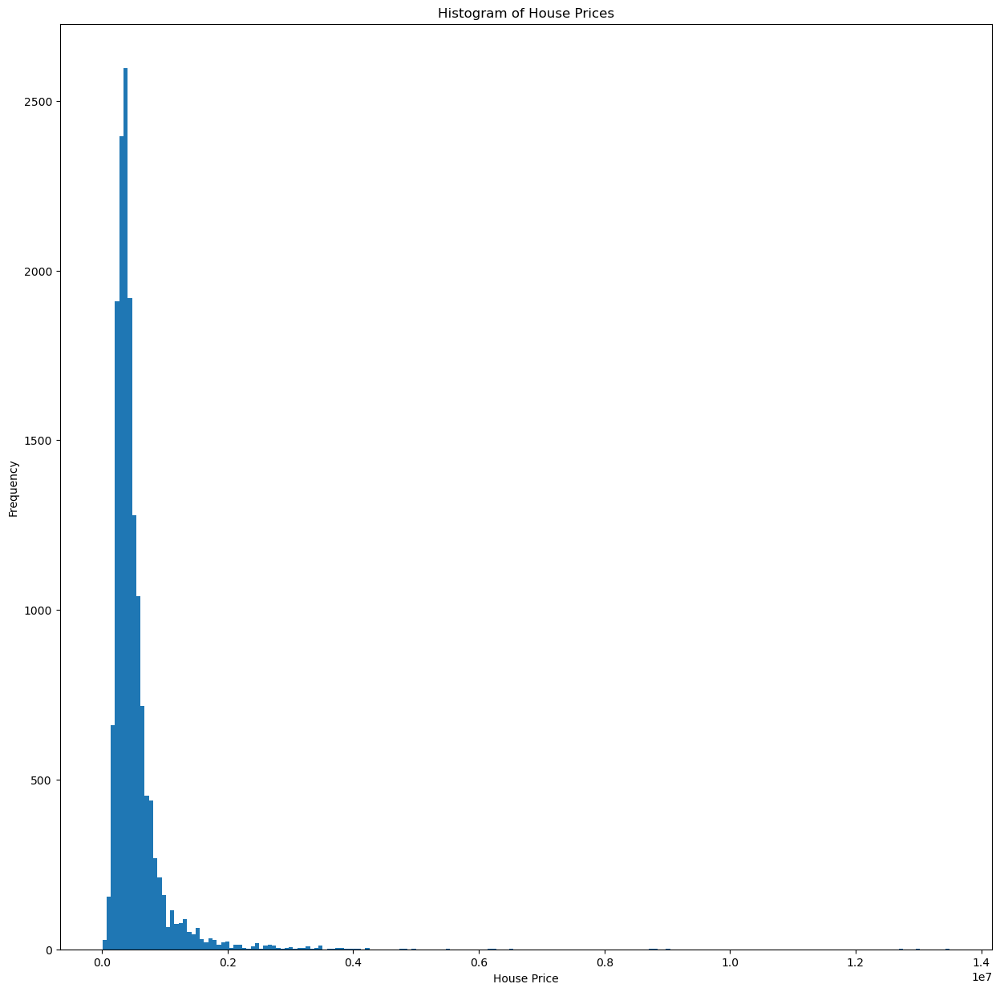

In [106]:
plt.figure(figsize=(15, 15))
plt.hist(y, bins=200)
plt.title('Histogram of House Prices')
plt.xlabel('House Price')
plt.ylabel('Frequency')
plt.show()

In [107]:
max(y)

13500000.0

In [108]:
min(y)

5500.0

When I graph frequency of housing prices in the plot above, I see that there are some outliers, at least on the upper end of the spectrum. Let's remove them and then re-run the linear regression model.

In [109]:
housing_clean2 = pd.concat([X, y], axis=1)
print(housing_clean2.head())
housing_clean2.shape

   hasSpa  hasView  parkingSpaces  yearBuilt  numPriceChanges  numOfPhotos  \
0       0        0              2       2012                5           39   
1       0        0              2       2013                1           29   
2       0        0              0       2018                1            2   
3       0        0              2       2013                4            9   
4       0        0              0       2002                3           27   

   numOfWaterfrontFeatures  lotSizeSqFt  livingAreaSqFt  city_del valle  \
0                        0       6011.0          2601.0               0   
1                        0       6185.0          1768.0               0   
2                        0       7840.0          1478.0               0   
3                        0       6098.0          1678.0               0   
4                        0       6708.0          2132.0               0   

   homeType_Multiple Occupancy  homeType_Vacant Land  latestPrice  
0           

(15169, 13)

In [110]:
# Specify the threshold value
threshold_max = 500000
threshold_min = 100000

# Use boolean indexing to filter rows
housing_clean2 = housing_clean2[housing_clean2['latestPrice'] <= threshold_max]
housing_clean2 = housing_clean2[housing_clean2['latestPrice'] >= threshold_min]

# Display the resulting DataFrame
housing_clean2.shape

(10264, 13)

In [111]:
# By removing houses priced above $500,000, we went from 15,167 rows to 10,322. We benchmarked the $500,000 threshold based on 3rd price 
# quartile being $575,000 and based on the histogram plot we looked at above. Let's now re-run our linear regression.

In [112]:
X = housing_clean2.drop("latestPrice", axis=1)
y = housing_clean2["latestPrice"]

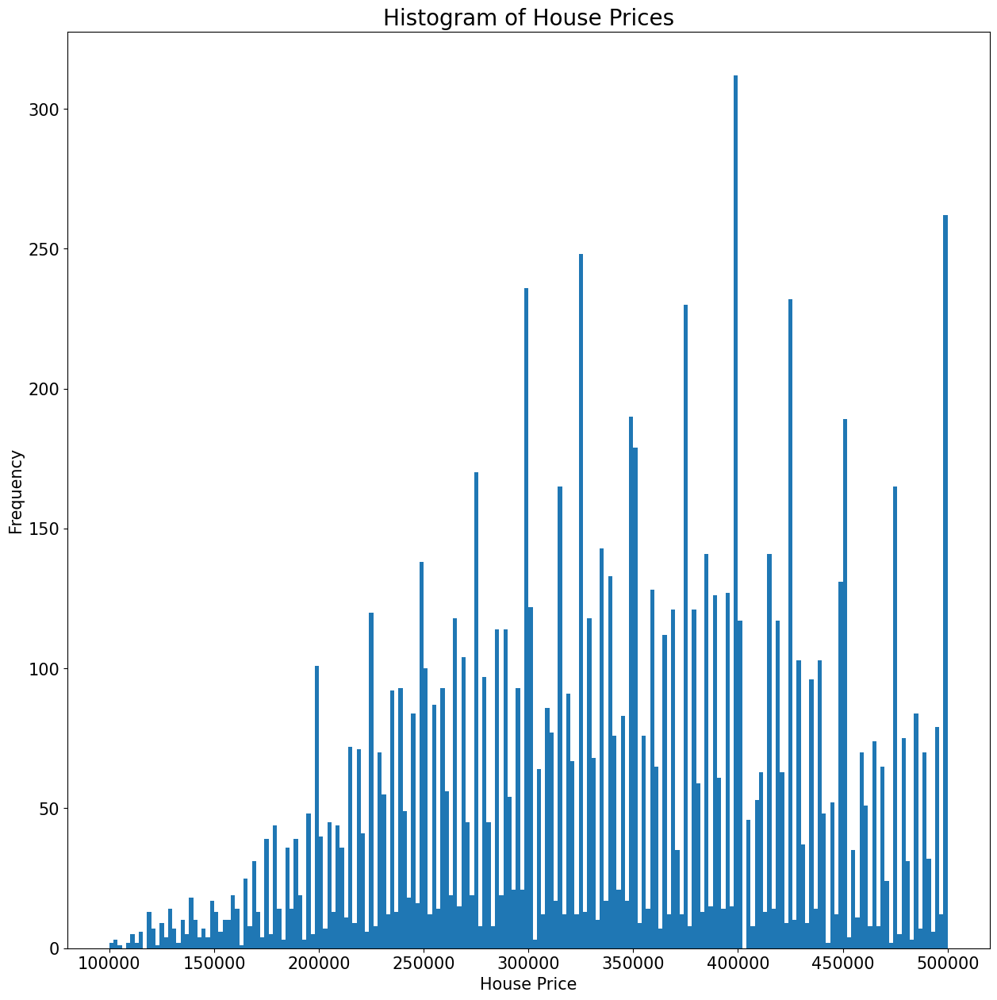

In [113]:
plt.figure(figsize=(15, 15))
plt.hist(y, bins=200)
plt.title('Histogram of House Prices', fontsize=20)
plt.xlabel('House Price', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [114]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [115]:
# Scale the data
from sklearn.preprocessing import StandardScaler

# Instantiate
ss = StandardScaler()

# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [116]:
from sklearn.linear_model import LinearRegression 

regression_model = LinearRegression()
regression_model.fit(X_train_ss, y_train)

print(regression_model.score(X_train_ss, y_train))
print(regression_model.score(X_test_ss, y_test))

0.1042266704586674
0.1444201398112086


I am seeing lower model scores, however, the train and test score are now closer to one another, and the test score is no longer negative (good sign that the model makes more sense).

In [117]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     79.49
Date:                Sun, 04 Feb 2024   Prob (F-statistic):          1.38e-185
Time:                        19:47:12   Log-Likelihood:            -1.0484e+05
No. Observations:                8211   AIC:                         2.097e+05
Df Residuals:                    8198   BIC:                         2.098e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.419e+05    938.262    364.371      0.000     3.4e+05    3.44e+05
x1          3895.5575    964.699      4.038      0.000    2004.504    5786.611
x2          3677.3172    957.867      3.839      0.000    1799.654    5554.980
x3          5098.9983   1002.847      5.085      0.000    3133.165    7064.832
x4         -1.093e+04    978.171    -11.177      0.000   -1.29e+04   -9015.524
x5         -1.128e+04    951.551    -11.854      0.000   -1.31e+04   -9414.212
x6          1.101e+04    982.903     11.200      0.000    9081.837    1.29e+04
x7          1352.9689    939.984      1.439      0.150    -489.638    3195.575
x8         -1793.6704    938.444     -1.911      0.056   -3633.259      45.918
x9          1.867e+04    968.063     19.284      0.000    1.68e+04    2.06e+04
x10        -1.122e+04    942.732    -11.902      0.000   -1.31e+04   -9372.540
x11        -1476.1006    941.019     -1.569      0.117   -3320.736     368.535
x12        -2613.7399    942.719     -2.773      0.006   -4461.707    -765.773
==============================================================================
Omnibus:                     1835.387   Durbin-Watson:                   2.031
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            25097.452
Skew:                          -0.686   Prob(JB):                         0.00
Kurtosis:                      11.454   Cond. No.                         1.51
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [118]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.109710
1,hasView,1.278217
2,parkingSpaces,2.026585
3,yearBuilt,6.361706
4,numPriceChanges,2.570063
5,numOfPhotos,3.477969
6,numOfWaterfrontFeatures,1.004227
7,lotSizeSqFt,1.001802
8,livingAreaSqFt,3.240445
9,city_del valle,1.010155


And now coefficients make a lot more sense! Fantastic. Let's again go through iterative process of removing the features with p-values > 0.05.

In [119]:
X.drop(["numOfWaterfrontFeatures" ], axis=1, inplace=True)

In [120]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [121]:
# Scale the data
from sklearn.preprocessing import StandardScaler

# Instantiate
ss = StandardScaler()

# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [122]:
from sklearn.linear_model import LinearRegression 

regression_model = LinearRegression()
regression_model.fit(X_train_ss, y_train)

print(regression_model.score(X_train_ss, y_train))
print(regression_model.score(X_test_ss, y_test))

0.10400029720357817
0.14475567086133678


In [123]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     86.52
Date:                Sun, 04 Feb 2024   Prob (F-statistic):          4.04e-186
Time:                        19:47:12   Log-Likelihood:            -1.0485e+05
No. Observations:                8211   AIC:                         2.097e+05
Df Residuals:                    8199   BIC:                         2.098e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.419e+05    938.324    364.347      0.000     3.4e+05    3.44e+05
x1          3874.7555    964.653      4.017      0.000    1983.790    5765.721
x2          3712.5074    957.618      3.877      0.000    1835.334    5589.681
x3          5121.7730   1002.787      5.108      0.000    3156.056    7087.490
x4         -1.097e+04    977.955    -11.214      0.000   -1.29e+04   -9049.582
x5         -1.128e+04    951.613    -11.854      0.000   -1.31e+04   -9414.715
x6          1.106e+04    982.204     11.265      0.000    9138.944     1.3e+04
x7         -1793.2855    938.506     -1.911      0.056   -3632.994      46.423
x8          1.867e+04    968.126     19.281      0.000    1.68e+04    2.06e+04
x9         -1.122e+04    942.793    -11.900      0.000   -1.31e+04   -9370.866
x10        -1479.6404    941.077     -1.572      0.116   -3324.390     365.109
x11        -2614.2032    942.780     -2.773      0.006   -4462.291    -766.115
==============================================================================
Omnibus:                     1834.701   Durbin-Watson:                   2.032
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            25041.059
Skew:                          -0.686   Prob(JB):                         0.00
Kurtosis:                      11.444   Cond. No.                         1.51
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [124]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.109449
1,hasView,1.277565
2,parkingSpaces,2.026168
3,yearBuilt,6.359684
4,numPriceChanges,2.570020
5,numOfPhotos,3.471516
6,lotSizeSqFt,1.001802
7,livingAreaSqFt,3.240333
8,city_del valle,1.010154
9,homeType_Multiple Occupancy,1.011007


Although the lotSizeSqFt has p-value of 0.090, let's keep it as it is not that far above 0.05. However, let's drop "homeType_Multiple Occupancy".

In [125]:
X.drop(["homeType_Multiple Occupancy" ], axis=1, inplace=True)

In [126]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [127]:
# Scale the data
from sklearn.preprocessing import StandardScaler

# Instantiate
ss = StandardScaler()

# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [128]:
from sklearn.linear_model import LinearRegression 

regression_model = LinearRegression()
regression_model.fit(X_train_ss, y_train)

print(regression_model.score(X_train_ss, y_train))
print(regression_model.score(X_test_ss, y_test))

0.10373014474135478
0.14466199913556166


In [129]:
X_withconstant = sm.add_constant(X_train_ss)

myregression = sm.OLS(y_train, X_withconstant)
myregression_results = myregression.fit()
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            latestPrice   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     94.90
Date:                Sun, 04 Feb 2024   Prob (F-statistic):          1.38e-186
Time:                        19:47:12   Log-Likelihood:            -1.0485e+05
No. Observations:                8211   AIC:                         2.097e+05
Df Residuals:                    8200   BIC:                         2.098e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.419e+05    938.408    364.314      0.000     3.4e+05    3.44e+05
x1          3914.5647    964.408      4.059      0.000    2024.081    5805.048
x2          3729.9426    957.640      3.895      0.000    1852.726    5607.159
x3          5036.7368   1001.418      5.030      0.000    3073.705    6999.769
x4         -1.091e+04    977.319    -11.161      0.000   -1.28e+04   -8991.657
x5         -1.127e+04    951.688    -11.845      0.000   -1.31e+04   -9407.476
x6          1.112e+04    981.614     11.330      0.000    9197.485     1.3e+04
x7         -1791.7926    938.589     -1.909      0.056   -3631.666      48.080
x8          1.864e+04    968.013     19.252      0.000    1.67e+04    2.05e+04
x9         -1.121e+04    942.870    -11.893      0.000   -1.31e+04   -9364.957
x10        -2601.2180    942.829     -2.759      0.006   -4449.401    -753.035
==============================================================================
Omnibus:                     1824.467   Durbin-Watson:                   2.032
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            24642.706
Skew:                          -0.684   Prob(JB):                         0.00
Kurtosis:                      11.376   Cond. No.                         1.50
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [130]:
features = X
calculate_vif(features)

,features,VIF_Value
0,hasSpa,1.108770
1,hasView,1.277558
2,parkingSpaces,2.022002
3,yearBuilt,6.350148
4,numPriceChanges,2.569689
5,numOfPhotos,3.466747
6,lotSizeSqFt,1.001801
7,livingAreaSqFt,3.239450
8,city_del valle,1.010096
9,homeType_Vacant Land,1.010170


### Decision Tree

In [131]:
housing_clean.shape

(15169, 55)

Let's run a decision tree regressor on the X and y. We have following cleaning data for the linear regression.

Best test scores given by:
   Depth  Train Score  Test Score
6      7     0.422223    0.280087 




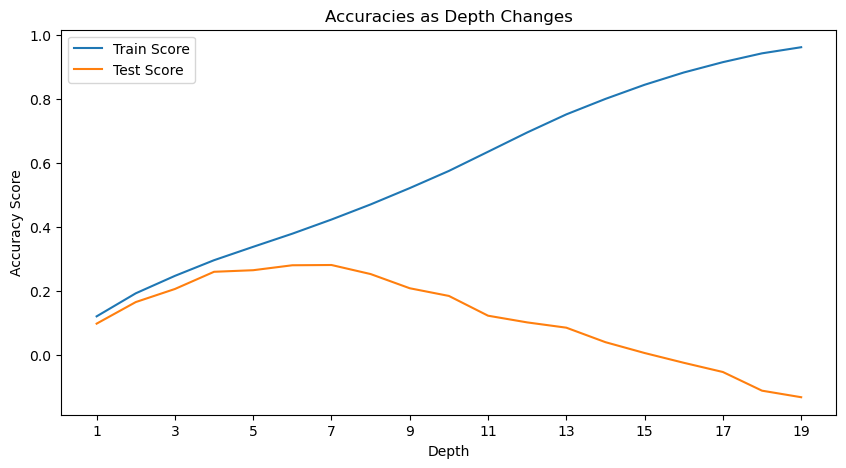

In [132]:
from sklearn.tree import DecisionTreeRegressor

scores = pd.DataFrame()
scores = {
    'Depth': [],
    'Train Score': [],
    'Test Score': []
}

depth_range = 20

# loop through the max depth values
for max_depth in range(1, depth_range):
    dt_model = DecisionTreeRegressor(max_depth=max_depth, random_state=21)
    dt_model.fit(X_train_ss, y_train)
    
    # scoring
    train_score = dt_model.score(X_train_ss, y_train)
    test_score = dt_model.score(X_test_ss, y_test)
    
    # append results
    # scores = scores.append({'Depth': max_depth, 'Train Score': train_score, 'Test Score': train_score}, ignore_index=True)
    scores['Depth'].append(max_depth)
    scores['Train Score'].append(train_score)
    scores['Test Score'].append(test_score)

scores_df = pd.DataFrame(scores)

# best parameter
best_score = scores_df['Test Score'].max()
print("Best test scores given by:")
print(scores_df[scores_df['Test Score'] == best_score], "\n\n")

# comparison plot
plt.figure(figsize=(10,5))
plt.plot('Depth', 'Train Score', data=scores_df)
plt.plot('Depth', 'Test Score', data=scores_df)
plt.title('Accuracies as Depth Changes')
plt.xlabel('Depth')
plt.xticks(range(1,depth_range, 2))
plt.ylabel('Accuracy Score')
plt.legend()
plt.show()

The model is overfitting at higher depth (train score - higher; test score - lower). I would recommend selecting depth of 5 as the optimal for the model, since test accuracy does not improve drastically following that point and train and test scores start to diverge then.

In [133]:
dt_model = DecisionTreeRegressor(max_depth=5, random_state=21)
dt_model.fit(X_train_ss, y_train)
    
train_score = dt_model.score(X_train_ss, y_train)
test_score = dt_model.score(X_test_ss, y_test)
    
print(train_score)
print(test_score)

0.33696846317506934
0.2637991406497474


In [134]:
# Let's also try fitting a decision tree using 54 independent variables (as opposed to the reduced amount of variables we used in linear regression)

X = housing_clean.drop("latestPrice", axis=1)
y = housing_clean["latestPrice"]

In [135]:
X.head()

,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,parkingSpaces,yearBuilt,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,city_del valle,city_driftwood,city_dripping springs,city_manchaca,city_manor,city_pflugerville,city_road,city_west lake hills,homeType_Condo,homeType_Mobile / Manufactured,homeType_MultiFamily,homeType_Multiple Occupancy,homeType_Other,homeType_Residential,homeType_Single Family,homeType_Townhouse,homeType_Vacant Land
0,30.430632,-97.663078,1.98,2,1,1,1,1,0,0,2,2012,5,9,2019,39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
1,30.432673,-97.661697,1.98,2,1,1,1,1,0,0,2,2013,1,10,2020,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
2,30.409748,-97.639771,1.98,0,1,1,0,1,0,0,0,2018,1,7,2019,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
3,30.432112,-97.661659,1.98,2,1,1,1,1,0,0,2,2013,4,8,2018,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
4,30.437368,-97.656860,1.98,0,1,1,0,1,0,0,0,2002,3,10,2018,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


In [136]:
X.shape

(15169, 54)

In [137]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [138]:
# Scale the data
from sklearn.preprocessing import StandardScaler

# Instantiate
ss = StandardScaler()

# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

Best test scores given by:
   Depth  Train Score  Test Score
2      3     0.518336    0.468799 




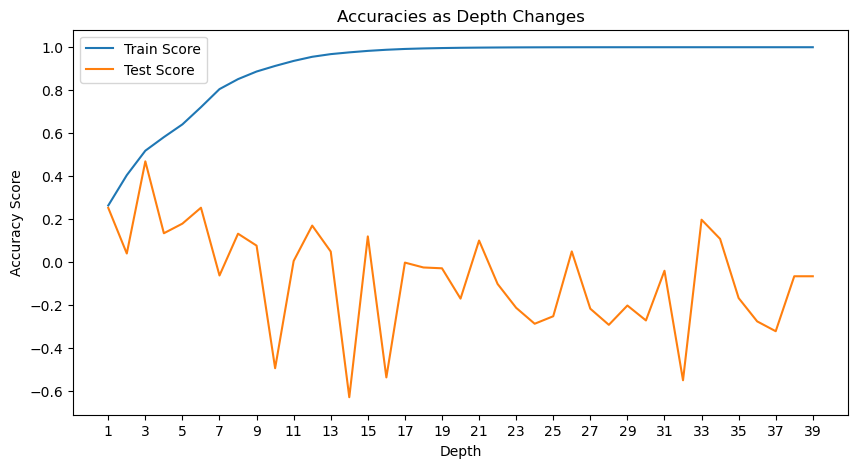

In [139]:
scores = pd.DataFrame()
scores = {
    'Depth': [],
    'Train Score': [],
    'Test Score': []
}

depth_range = 40

# loop through the max depth values
for max_depth in range(1, depth_range):
    dt_model = DecisionTreeRegressor(max_depth=max_depth, random_state=21)
    dt_model.fit(X_train_ss, y_train)
    
    # scoring
    train_score = dt_model.score(X_train_ss, y_train)
    test_score = dt_model.score(X_test_ss, y_test)
    
    # append results
    # scores = scores.append({'Depth': max_depth, 'Train Score': train_score, 'Test Score': train_score}, ignore_index=True)
    scores['Depth'].append(max_depth)
    scores['Train Score'].append(train_score)
    scores['Test Score'].append(test_score)

scores_df = pd.DataFrame(scores)

# best parameter
best_score = scores_df['Test Score'].max()
print("Best test scores given by:")
print(scores_df[scores_df['Test Score'] == best_score], "\n\n")

# comparison plot
plt.figure(figsize=(10,5))
plt.plot('Depth', 'Train Score', data=scores_df)
plt.plot('Depth', 'Test Score', data=scores_df)
plt.title('Accuracies as Depth Changes')
plt.xlabel('Depth')
plt.xticks(range(1,depth_range, 2))
plt.ylabel('Accuracy Score')
plt.legend()
# I would plt.show()

In [140]:
# I would recommend to go with 3 leaves, in this case 

dt_model = DecisionTreeRegressor(max_depth=3, random_state=21)
dt_model.fit(X_train_ss, y_train)
    
train_score = dt_model.score(X_train_ss, y_train)
test_score = dt_model.score(X_test_ss, y_test)
    
print(train_score)
print(test_score)

0.518336293934973
0.4687994302434254


We get a 47% train score for the Decision Tree (without excluding outliers).

In [141]:
# Let's run the decision tree one more time after removing outliers
# Specify the threshold value
threshold_max = 500000
threshold_min = 100000

# Use boolean indexing to filter rows
housing_clean3 = housing_clean[housing_clean['latestPrice'] <= threshold_max]
housing_clean3 = housing_clean3[housing_clean3['latestPrice'] >= threshold_min]

# Display the resulting DataFrame
housing_clean3.shape

(10264, 55)

In [142]:
X = housing_clean3.drop("latestPrice", axis=1)
y = housing_clean3["latestPrice"]

In [143]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [144]:
# Scale the data
from sklearn.preprocessing import StandardScaler

# Instantiate
ss = StandardScaler()

# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

Best test scores given by:
   Depth  Train Score  Test Score
6      7     0.557651    0.450826 




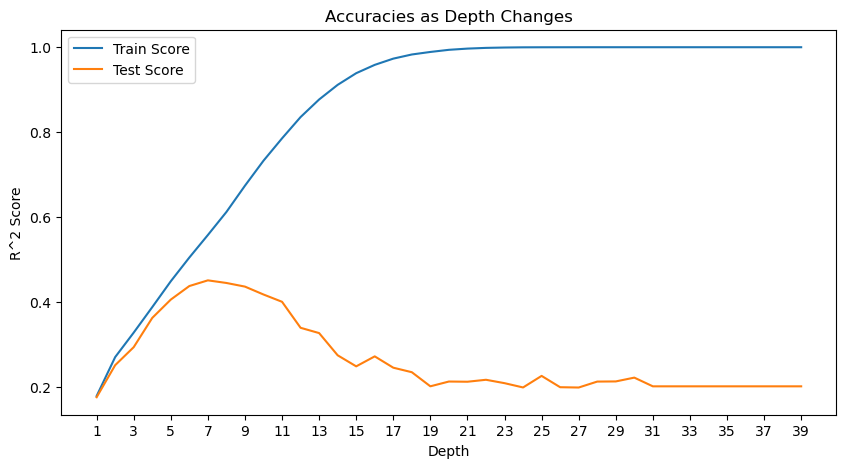

In [145]:
scores = pd.DataFrame()
scores = {
    'Depth': [],
    'Train Score': [],
    'Test Score': []
}

depth_range = 40

# loop through the max depth values
for max_depth in range(1, depth_range):
    dt_model = DecisionTreeRegressor(max_depth=max_depth, random_state=21)
    dt_model.fit(X_train_ss, y_train)
    
    # scoring
    train_score = dt_model.score(X_train_ss, y_train)
    test_score = dt_model.score(X_test_ss, y_test)
    
    # append results
    # scores = scores.append({'Depth': max_depth, 'Train Score': train_score, 'Test Score': train_score}, ignore_index=True)
    scores['Depth'].append(max_depth)
    scores['Train Score'].append(train_score)
    scores['Test Score'].append(test_score)

scores_df = pd.DataFrame(scores)

# best parameter
best_score = scores_df['Test Score'].max()
print("Best test scores given by:")
print(scores_df[scores_df['Test Score'] == best_score], "\n\n")

# comparison plot
plt.figure(figsize=(10,5))
plt.plot('Depth', 'Train Score', data=scores_df)
plt.plot('Depth', 'Test Score', data=scores_df)
plt.title('Accuracies as Depth Changes')
plt.xlabel('Depth')
plt.xticks(range(1,depth_range, 2))
plt.ylabel('R^2 Score')
plt.legend()
# I would plt.show()

In [146]:
# I would recommend to go with depth of 7, in this case.   

dt_model = DecisionTreeRegressor(max_depth=7, random_state=21)
dt_model.fit(X_train_ss, y_train)
    
train_score = dt_model.score(X_train_ss, y_train)
test_score = dt_model.score(X_test_ss, y_test)
    
print(train_score)
print(test_score)

0.5576514445043801
0.45082570024987967


The test score when excluding outliers is 45%.

### KNN Regressor

In [147]:
housing_clean.shape

(15169, 55)

In [148]:
X = housing_clean.drop("latestPrice", axis=1)
y = housing_clean["latestPrice"]

In [149]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [150]:
# Scale the data
from sklearn.preprocessing import StandardScaler

# Instantiate
ss = StandardScaler()

# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

In [151]:
from sklearn.neighbors import KNeighborsRegressor

# Create the KNN regressor object
knn_regressor = KNeighborsRegressor(n_neighbors=5) # randomly selected number of neighbors

# Train the regressor on the training data
knn_regressor.fit(X_train_ss, y_train)

# Predict on the testing set
y_pred = knn_regressor.predict(X_test_ss)

# Scoring

train_score = knn_regressor.score(X_train_ss, y_train)
test_score = knn_regressor.score(X_test_ss, y_test)

print(train_score)
print(test_score)

0.6401135425441898
0.45840816501060233


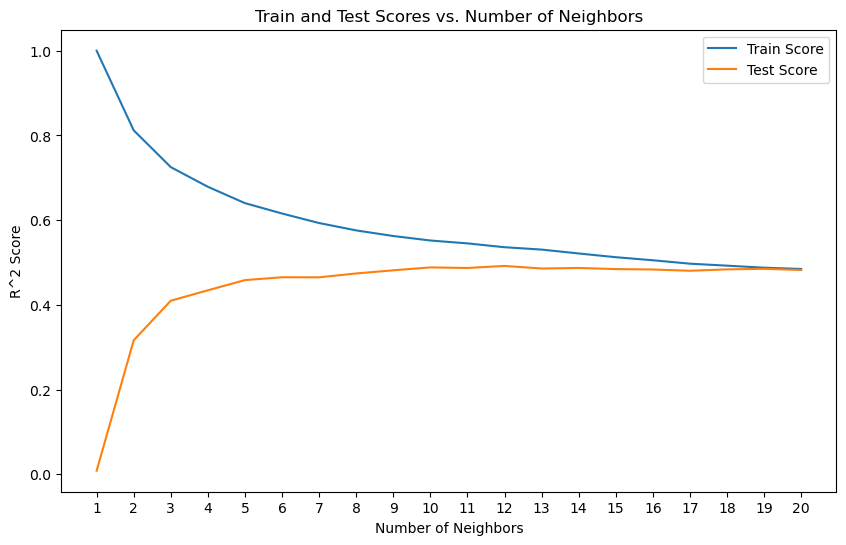

In [152]:
# Let's look at graph Train and Test Scores given various "neighbors" hyperparameter

from sklearn.metrics import r2_score

# Define a range of values for n_neighbors
neighbors_range = range(1, 21)  # Example range from 1 to 20

# Initialize lists to store train and test scores
train_scores = []
test_scores = []

# Train the KNN regressor for each value of n_neighbors
for n_neighbors in neighbors_range:
    # Create the KNN regressor object
    knn_regressor = KNeighborsRegressor(n_neighbors=n_neighbors)
    
    # Train the regressor on the training data
    knn_regressor.fit(X_train_ss, y_train)
    
    # Predict on the training set
    y_train_pred = knn_regressor.predict(X_train_ss)
    
    # Compute R^2 score for training set
    train_score = r2_score(y_train, y_train_pred)
    train_scores.append(train_score)
    
    # Predict on the testing set
    y_test_pred = knn_regressor.predict(X_test_ss)
    
    # Compute R^2 score for testing set
    test_score = r2_score(y_test, y_test_pred)
    test_scores.append(test_score)

# Plot the train and test scores against n_neighbors
plt.figure(figsize=(10, 6))
plt.plot(neighbors_range, train_scores, label='Train Score')
plt.plot(neighbors_range, test_scores, label='Test Score')
plt.title('Train and Test Scores vs. Number of Neighbors')
plt.xlabel('Number of Neighbors')
plt.ylabel('R^2 Score')
plt.xticks(neighbors_range)
plt.legend()
plt.show()

Here, I would recommend using 10 neighbors.

In [153]:
from sklearn.neighbors import KNeighborsRegressor

# Create the KNN regressor object
knn_regressor = KNeighborsRegressor(n_neighbors=10)

# Train the regressor on the training data
knn_regressor.fit(X_train_ss, y_train)

# Predict on the testing set
y_pred = knn_regressor.predict(X_test_ss)

# Scoring
train_score = knn_regressor.score(X_train_ss, y_train)
test_score = knn_regressor.score(X_test_ss, y_test)

print(train_score)
print(test_score)

3034
3034
3034
0.5519008580895466
0.48836715594704183


In [154]:
y_pred

array([506540. , 419390. , 482670. , ..., 628878.7, 641930. , 725630. ])

In [155]:
y_pred = pd.DataFrame(y_pred)

In [156]:
y_pred.shape

(3034, 1)

In [157]:
print(type(X_test_ss))
print(type(y_test))
print(type(y_pred))

<class 'numpy.ndarray'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.frame.DataFrame'>


In [158]:
X_test_ss = pd.DataFrame(X_test_ss)

In [159]:
housing_predictions = pd.concat([X_test_ss, y_test, y_pred], axis=1)
housing_predictions.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,latestPrice,0
0,0.490002,0.657316,-0.264703,-0.167934,-1.057961,0.134302,0.90638,0.099938,-0.294917,-0.543859,-0.164273,-1.563860,1.213035,1.357540,1.134470,3.186918,-0.072711,0.270216,1.630372,3.416589,3.069630,-0.044593,-0.427345,-0.094753,-0.031423,-0.509196,0.253366,-0.211631,-0.138738,0.080613,-0.945714,0.655310,-0.149092,0.658007,-0.661006,-0.517835,-0.895929,-0.07395,-0.024025,-0.018159,-0.012839,-0.020303,-0.05142,-0.009078,-0.012839,-0.178817,-0.03518,-0.025684,-0.078329,-0.022241,-0.049783,0.256299,-0.109586,-0.074511,305000.0,506540.0
1,-0.981577,-1.320668,-0.264703,0.568828,0.945215,0.134302,0.90638,0.099938,-0.294917,-0.543859,0.572134,0.573595,-0.409828,-1.503203,1.134470,0.022650,-0.072711,1.850492,0.363187,-0.674317,4.280735,-0.044593,1.617543,-0.094753,-0.026216,-0.201628,0.253366,-0.211631,-0.138738,0.080613,-0.568890,1.730682,1.584139,1.809319,-0.661006,-0.517835,-0.895929,-0.07395,-0.024025,-0.018159,-0.012839,-0.020303,-0.05142,-0.009078,-0.012839,-0.178817,-0.03518,-0.025684,-0.078329,-0.022241,-0.049783,0.256299,-0.109586,-0.074511,NaN,419390.0
2,-1.192302,-0.632057,-0.264703,0.568828,-1.057961,0.134302,0.90638,0.099938,-0.294917,-0.543859,0.572134,-0.216334,0.807320,-1.821063,1.134470,-0.265011,-0.072711,-0.256543,1.630372,-0.674317,-0.563685,-0.044593,-0.427345,-0.094753,-0.028661,1.053993,0.253366,-0.211631,-0.138738,0.080613,-0.066456,-0.420063,0.650154,0.082352,5.140708,5.359387,1.011123,-0.07395,-0.024025,-0.018159,-0.012839,-0.020303,-0.05142,-0.009078,-0.012839,-0.178817,-0.03518,-0.025684,12.766616,-0.022241,-0.049783,-3.901700,-0.109586,-0.074511,NaN,482670.0
3,-1.004317,-0.637745,-0.264703,-0.904697,-1.057961,0.134302,-1.10329,0.099938,-0.294917,-0.543859,-0.900679,0.201864,-0.815544,-1.503203,-0.095806,0.166481,-0.072711,0.270216,-0.903999,-0.674317,-0.563685,-0.044593,-0.427345,-0.094753,-0.037166,-0.530432,0.253366,-0.211631,-0.138738,0.080613,-0.694498,0.476081,0.680777,0.658007,0.305947,-0.517835,1.011123,-0.07395,-0.024025,-0.018159,-0.012839,-0.020303,-0.05142,-0.009078,-0.012839,-0.178817,-0.03518,-0.025684,-0.078329,-0.022241,-0.049783,0.256299,-0.109586,-0.074511,NaN,394420.0
4,0.602581,0.540757,-0.264703,2.042353,-1.057961,0.134302,0.90638,0.099938,-0.294917,-0.543859,2.044947,-1.424460,0.401604,1.039680,1.134470,2.515710,-0.072711,0.796975,0.363187,-0.674317,0.647420,-0.044593,1.617543,-0.094753,-0.027597,-0.109836,0.253366,-0.211631,-0.138738,0.080613,-0.757302,0.655310,-0.149092,0.658007,0.305947,0.657610,-0.895929,-0.07395,-0.024025,-0.018159,-0.012839,-0.020303,-0.05142,-0.009078,-0.012839,-0.178817,-0.03518,-0.025684,-0.078329,-0.022241,-0.049783,0.256299,-0.109586,-0.074511,NaN,558640.0


In [160]:
# # Save the housing_predictions dataframe to a CSV file
# housing_predictions.to_csv('housing_predictions.csv', index=False) # don't need to do it at every re-run of the model

After exporting the data to CSV, I ran analysis on variation between predicted and actual prices. I concluded that predicted house price is within 40% of actual house price ~50% of the time, given the KNN Regressor without excluding outliers.

In [161]:
# from sklearn.inspection import permutation_importance

# # Compute permutation importance
# perm_importance = permutation_importance(knn_regressor, X_test_ss, y_test, n_repeats=10, random_state=42)

# # Get feature importance scores
# feature_importance = perm_importance.importances_mean

# # Get indices of features sorted by importance
# sorted_indices = feature_importance.argsort()[::-1]

# # Print feature importance scores and corresponding feature names
# for i in sorted_indices:
#     print(f"Feature {i+1}: {feature_importance[i]}")

# # This is a heavy cell to run, commenting it out to not re-run every time

In [162]:
X_test

,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,parkingSpaces,yearBuilt,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,city_del valle,city_driftwood,city_dripping springs,city_manchaca,city_manor,city_pflugerville,city_road,city_west lake hills,homeType_Condo,homeType_Mobile / Manufactured,homeType_MultiFamily,homeType_Multiple Occupancy,homeType_Other,homeType_Residential,homeType_Single Family,homeType_Townhouse,homeType_Vacant Land
11885,30.339422,-97.722801,1.98,1,0,1,1,1,0,0,1,1955,6,11,2020,97,0,4,3,4,3,0,0,0,7.405000e+03,1470.0,1,0,1,1,0.833333,7.000000,1189,16,2.0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
13581,30.196487,-97.889946,1.98,2,1,1,1,1,0,0,2,2001,2,2,2020,31,0,7,2,0,4,0,1,0,9.539000e+03,1919.0,1,0,1,1,1.233333,9.000000,1755,18,2.0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4974,30.176020,-97.831757,1.98,2,0,1,1,1,0,0,2,1984,5,1,2020,25,0,3,3,0,0,0,0,0,8.537000e+03,3752.0,1,0,1,1,1.766667,5.000000,1450,15,8.0,8,2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
6744,30.194279,-97.832237,1.98,0,0,1,0,1,0,0,0,1993,1,2,2019,34,0,4,1,0,0,0,0,0,5.052000e+03,1439.0,1,0,1,1,1.100000,6.666667,1460,16,3.0,3,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
7895,30.350357,-97.732651,1.98,4,0,1,1,1,0,0,4,1958,4,10,2020,83,0,5,2,0,1,0,1,0,8.973000e+03,2053.0,1,0,1,1,1.033333,7.000000,1189,16,3.0,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
10240,30.239433,-97.691994,1.98,4,0,1,1,1,0,1,4,2020,2,12,2020,40,0,4,2,2,1,0,0,0,7.274000e+03,2435.0,1,0,1,1,1.366667,3.333333,473,11,3.0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2810,30.383057,-97.748795,1.98,2,0,1,1,1,0,0,2,1969,4,3,2020,3,0,2,3,0,0,0,0,0,1.176120e+04,1637.0,1,0,1,1,0.933333,7.000000,1523,17,2.0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
12758,30.186544,-97.892944,1.98,0,1,1,0,1,0,0,0,1996,1,7,2018,1,0,0,1,0,0,0,0,0,8.712000e+03,2242.0,1,0,1,1,1.500000,9.000000,1755,18,2.0,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5620,30.390741,-97.894020,1.98,0,0,1,0,1,0,0,0,1991,1,8,2019,20,0,0,1,1,0,0,0,0,4.878720e+04,2248.0,1,0,1,1,2.300000,8.333333,1476,17,3.0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3445,30.366505,-97.698753,1.98,1,1,1,1,1,0,0,1,1972,2,2,2020,23,0,4,2,0,0,0,0,0,4.260000e+03,1237.0,1,0,1,1,1.200000,4.333333,983,14,2.0,3,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


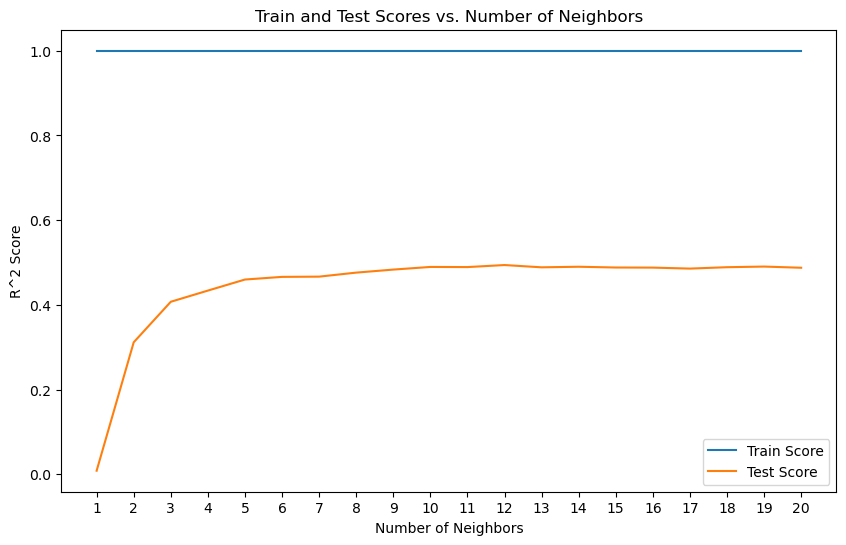

In [163]:
# Let's look at graph Train and Test Scores by setting "weights" hyperparameter to "distance" 

from sklearn.metrics import r2_score

# Define a range of values for n_neighbors
neighbors_range = range(1, 21)  # Example range from 1 to 20

# Initialize lists to store train and test scores
train_scores = []
test_scores = []

# Train the KNN regressor for each value of n_neighbors
for n_neighbors in neighbors_range:
    # Create the KNN regressor object
    knn_regressor = KNeighborsRegressor(n_neighbors=n_neighbors, weights='distance')
    
    # Train the regressor on the training data
    knn_regressor.fit(X_train_ss, y_train)
    
    # Predict on the training set
    y_train_pred = knn_regressor.predict(X_train_ss)
    
    # Compute R^2 score for training set
    train_score = r2_score(y_train, y_train_pred)
    train_scores.append(train_score)
    
    # Predict on the testing set
    y_test_pred = knn_regressor.predict(X_test_ss)
    
    # Compute R^2 score for testing set
    test_score = r2_score(y_test, y_test_pred)
    test_scores.append(test_score)

# Plot the train and test scores against n_neighbors
plt.figure(figsize=(10, 6))
plt.plot(neighbors_range, train_scores, label='Train Score')
plt.plot(neighbors_range, test_scores, label='Test Score')
plt.title('Train and Test Scores vs. Number of Neighbors')
plt.xlabel('Number of Neighbors')
plt.ylabel('R^2 Score')
plt.xticks(neighbors_range)
plt.legend()
plt.show()

Setting hyperparameter "weights" to "distance" (meaning that closer neighbors will have more influence on the prediction than farther ones) makes the model overfit.
Let's additionally take a look at the same model, but after removing outliers.

In [164]:
# Specify the threshold value
threshold_max = 500000
threshold_min = 100000

# Use boolean indexing to filter rows
housing_clean4 = housing_clean[housing_clean['latestPrice'] <= threshold_max]
housing_clean4 = housing_clean4[housing_clean4['latestPrice'] >= threshold_min]

# Display the resulting DataFrame
housing_clean4.shape

(10264, 55)

In [165]:
X = housing_clean4.drop("latestPrice", axis=1)
y = housing_clean4["latestPrice"]

In [166]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [167]:
# Scale the data
from sklearn.preprocessing import StandardScaler

# Instantiate
ss = StandardScaler()

# Fit
ss.fit(X_train)

# Transform
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)

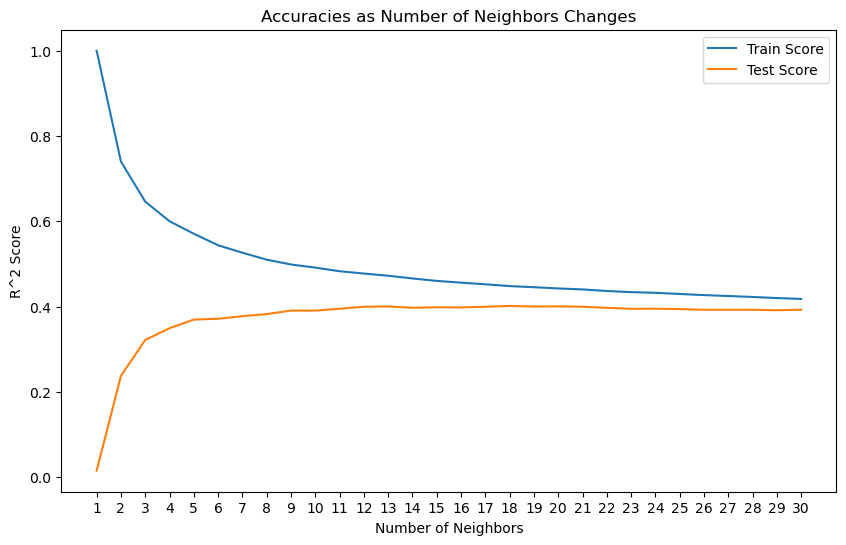

In [168]:
# Let's look at graph Train and Test Scores given various "neighbors" hyperparameter

from sklearn.metrics import r2_score

# Define a range of values for n_neighbors
neighbors_range = range(1, 31)  # Example range from 1 to 30

# Initialize lists to store train and test scores
train_scores = []
test_scores = []

# Train the KNN regressor for each value of n_neighbors
for n_neighbors in neighbors_range:
    # Create the KNN regressor object
    knn_regressor = KNeighborsRegressor(n_neighbors=n_neighbors)
    
    # Train the regressor on the training data
    knn_regressor.fit(X_train_ss, y_train)
    
    # Predict on the training set
    y_train_pred = knn_regressor.predict(X_train_ss)
    
    # Compute R^2 score for training set
    train_score = r2_score(y_train, y_train_pred)
    train_scores.append(train_score)
    
    # Predict on the testing set
    y_test_pred = knn_regressor.predict(X_test_ss)
    
    # Compute R^2 score for testing set
    test_score = r2_score(y_test, y_test_pred)
    test_scores.append(test_score)

# Plot the train and test scores against n_neighbors
plt.figure(figsize=(10, 6))
plt.plot(neighbors_range, train_scores, label='Train Score')
plt.plot(neighbors_range, test_scores, label='Test Score')
plt.title('Accuracies as Number of Neighbors Changes')
plt.xlabel('Number of Neighbors')
plt.ylabel('R^2 Score')
plt.xticks(neighbors_range)
plt.legend()
plt.show()

The result is similar to that without removing outliers. I would recomment using n_neighbours=10 as the hyperparameter.

In [169]:
from sklearn.neighbors import KNeighborsRegressor

# Create the KNN regressor object
knn_regressor = KNeighborsRegressor(n_neighbors=10)

# Train the regressor on the training data
knn_regressor.fit(X_train_ss, y_train)

# Predict on the testing set
y_pred = knn_regressor.predict(X_test_ss)

# Scoring

train_score = knn_regressor.score(X_train_ss, y_train)
test_score = knn_regressor.score(X_test_ss, y_test)

print(train_score)
print(test_score)

0.49141065292174624
0.39054894985538


We end up with 39% test score when excluding outliers.

As our analysis revealed, the best peforming models, as measured by test scores, are: (1) Decision Tree - with 47% R^2 score without excluding outliers and (2) KNN Regressor - with 49% R^2 score without excluding outliers. While the test score of ~50% is not too high as an absolute value, we are satusfied with it for our purpose. The result proves that pricing houses is a combination of art & science, and the model we have developed, along, would not be sufficient to accurately determine prices (would likely need human interference).